Time Log:
  * Nov 21 - 2 hours (initial research, began exploring data and wavelet transform, figured out how to load data from drive)
  
  * Nov 22 - 2 hours (implemented a wavelet decomposition for use in data loader)
  
  * Nov 23 - 4 hours (created data loader with optional wavelet decomposition transform function,
  created basic 1d convolutional net. Created training loop.)
  
  * Dec 1 - 4 1/3 hours (debugged training loop and got initial results)
  
  * Dec 3 - 2 hours (Implemented NLL loss function that uses weights)
  
  * Dec 5 - 2 hours (reworked networks and data loader to use decomposition in channel dimension instead of as rows. General debugging etc.)
  
  * Dec 14 - 1 hour (researching resnet and densenet architecture, remember to try dropout)
  
  * Dec 17 morning - 3 hours (implementing resnet, debugging block architecture)
  
  * Dec 17 evening - 1 hour (researching densenet architecture, try implementing bottlenecking and dropout in block structure)
  
  * Dec 18 morning - 2 1/2 hours (implementing densenet architecture)
  
  * Dec 18 evening - 2 1/6 hours (debugging densenet, setting up saving models to google drive, also a little work with gpu management)
  
  * Dec 19 - 4 hours (expirementing with parameters. Tried incremental raising of weight for primary class up from zero. Also testing downsampling performance vs loss function weights with large batches)
  
  * Dec 20: 10:40-2:00 (3 hours 20 minutes) (testing several different configurations, with and without wavelet transform to find optimal network and dataset options)
  
  *                 2:20-4:00 (1 hour, 40 minutes) (Achieved optimum results >98% accuarcy averaged overa all classes using a fully implemented DenseNet)
  
  Future work: add dropout to densenet
  
  Total: 35 hours
  
  
  
  Overall the best results were achieved using a DenseNet architecture. After only about 4 hours of training it achieved a class averaged accuracy of 98.7% with several classes achieving nearly perfect accuracy. Adding additional information in the form of a wavelet decomposition across additional channels made it dramatically more difficult to train all nets tested.

## Imports and installation

In [0]:
!pip3 install torch
!pip install gputil

    100% |████████████████████████████████| 591.8MB 27kB/s 
tcmalloc: large alloc 1073750016 bytes == 0x61880000 @  0x7f8aee4612a4 0x591a07 0x5b5d56 0x502e9a 0x506859 0x502209 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x507641 0x502209 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x507641 0x504c28 0x502540 0x502f3d 0x507641
  Running setup.py bdist_wheel for gputil ... - \ done
  Stored in directory: /root/.cache/pip/wheels/3d/77/07/80562de4bb0786e5ea186911a2c831fdd0018bda69beab71fd
Successfully built gputil


In [0]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
import numpy as np
from tqdm import tqdm
from matplotlib import pyplot as plt

import pandas as pd
from google.colab import drive # used to load and save files to google drive

from scipy.signal import fftconvolve

import GPUtil as GPU
GPUs = GPU.getGPUs()
gpu = GPUs[0]

### Sync drive and upload data files




In [0]:
# Mount google drive at specified location. This will prompt for authorization.
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
!ls "/content/drive/My Drive/CS501/Heartbeat"

denseNet1.pt		      denseNet_low_first_weight.pt  mitbih_train.csv
denseNet_balanced_classes.pt  mitbih_test.csv		    test.pt


In [0]:
#load data
root = "/content/drive/My Drive/CS501/Heartbeat/"
mitbih = pd.concat([pd.read_csv(root+'mitbih_train.csv',header=None), pd.read_csv(root+'mitbih_test.csv',header=None)], axis=0)
X = mitbih.values[:,:-1]
Y = mitbih.values[:,-1].astype(int)

## Data Handling

### Data exploration

In [0]:
# Find class distribution
classes, counts = np.unique(Y, return_counts=True)
classcounts = dict(zip(classes, counts))
totCount = len(Y)
for key in classcounts:
    classcounts[key] = classcounts[key]/totCount
    print(str('Class '+str(key)+': {:.1f}%').format(classcounts[key]*100))

Class 0: 82.8%
Class 1: 2.5%
Class 2: 6.6%
Class 3: 0.7%
Class 4: 7.3%


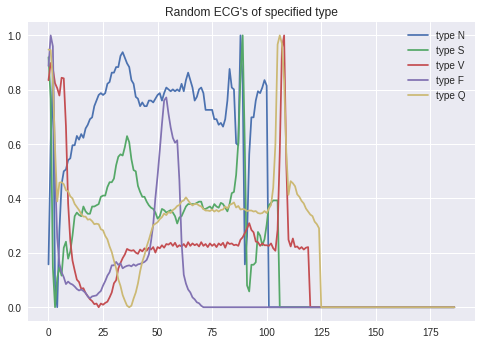

In [0]:
# Plot a random ECG of each type
type_dict = {0:'N',1:'S',2:'V',3:'F',4:'Q'}
for type_ in range(5):
  index = np.argwhere(Y == type_).flatten()
  index = np.random.choice(index)
  plt.plot(X[index,:],label='type ' + type_dict[type_])

plt.legend()
plt.title("Random ECG's of specified type")
plt.show()

### Implement dataloader class with wavelet decomposition option



#### Wavelet decomposition function

In [0]:
def linear_interp_dwt(X_data):
  """
  dwt function taken from a previous ACME lab, hence the detailed docstring.
  Receives one dimensional data and decomposes it into 5 wavelet functions.
  Linear interpolation is used so each has it's own domain.
  """
  def dwt(X, L, H, n):
    """
    Compute the discrete wavelet transform in one dimension using the Haar 
    wavelet filters.
    
    Parameters:
        X ((m, ) ndarray): A vector of length m on which to perform the 
            wavelet transform.
        L ((2, ) ndarray): Haar father low-pass decomposition filter.
        H ((2, ) ndarray): Haar father high-pass decomposition filter.
        n (int): The number of filter passes to perform.
        
    Returns:
        (list): A list of arrays of length n+1 consisting of the approximation
            coefficients followed by the successive levels of detail
            coefficients.
    """
    D = []
    A = X
    for i in range(n):
        D.append(fftconvolve(A,H)[1::2])
        A = fftconvolve(A,L)[1::2]
    D.append(A)
    return D[::-1]
  
  a, b = 0, 1
  m = len(X_data)
  new_data = np.zeros((6,m))
  new_data[0,:] = X_data
  
  L = np.ones(2)/np.sqrt(2)
  H = np.ones(2)/np.sqrt(2)
  H[0] = -H[0]
  coeffs = dwt(X_data, L, H, 4)

  for i in range(1,len(coeffs)+1):
    dom1 = np.linspace(a, b, len(coeffs[i-1]))

    dom2 = np.linspace(a, b, m)
    new_data[i,:] = np.interp(dom2,dom1,coeffs[i-1])
    
  return new_data

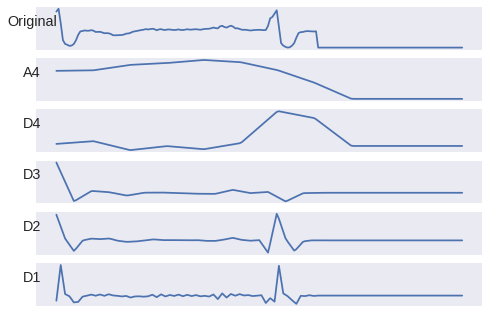

In [0]:
new_data = linear_interp_dwt(X[5,:])

fig, axes = plt.subplots(6,1)
axes[0].set_xticks([],[])
axes[0].set_yticks([],[])

dom = np.linspace(0,1,len(new_data[0,:]))
for i in range(len(new_data)):
    axes[i].plot(dom,new_data[i,:])
    axes[i].set_xticks([],[])
    axes[i].set_yticks([],[])
axes[0].set_ylabel("Original",rotation=0,size='large')
axes[1].set_ylabel("A4",rotation=0,size='large')
axes[2].set_ylabel("D4",rotation=0,size='large')
axes[3].set_ylabel("D3",rotation=0,size='large')
axes[4].set_ylabel("D2",rotation=0,size='large')
axes[5].set_ylabel("D1",rotation=0,size='large')
plt.show()

#### DataLoader

In [0]:
class ECG_Dataset(Dataset):
    """Loads ECG dataset in memory and returns with a transform if needed with __getitem__"""
    def __init__(self, train, transform=None, downsample=None):
      root = "/content/drive/My Drive/CS501/Heartbeat/"
      if train:
        mitbih = pd.read_csv(root+'mitbih_train.csv', header=None)
      else:
        mitbih = pd.read_csv(root+'mitbih_test.csv', header=None)
        
      self.X = mitbih.values[:,:-1]
      self.Y = mitbih.values[:,-1].astype(int)
      self.transform = transform
      
      if downsample is not None:
        full_indices = np.arange(len(self.Y))
        class_bools = (self.Y == 0)
        
        main_class_indices = full_indices[class_bools]
        
        num = int(downsample*len(main_class_indices))
        
        permutation = torch.randperm(len(main_class_indices))
        indices = permutation[:num]
        samples = main_class_indices[indices]
        
        final_indices = list(full_indices[(1- class_bools).astype(bool)]) + list(samples)
        
        #print(len(final_indices)/len(self.Y),len(main_class_indices)/len(self.Y),len(samples)/len(self.Y))
        
        self.X = self.X[final_indices]
        self.Y = self.Y[final_indices]
        
        
      
    def __len__(self):
      return len(self.Y)

    def __getitem__(self, idx):
      """Returns X and Y of selected index with appropriate transformation."""
      #one hot encode Y
      #y_out = torch.zeros(5)
      #y_out[self.Y[idx]] = 1
      
      # don't one hot encode Y
      y_out = self.Y[idx]
      
      if self.transform is None:
        return torch.from_numpy(self.X[idx,:]).unsqueeze(dim=0).float(), y_out
      else:
        return torch.from_numpy(self.transform(X[0,:])).float(), y_out

## Main training function

In [0]:
# Find way to save out network parameters each epoch
# Remember weights on CrossEntropyLoss for different classes
# Densenet topology vs. standard resnet
# Consider that a larger batch size allows for the gradient to account more for classes that are less represented. 
  # It doesn't matter what the weight is on a class if it doesn't appear in the batch.
  # Switching from a batch size of 50 or 100 up to 200 dramatically improved the learning curve for all classes.

In [0]:
def train_heartbeat(network, losses_train=[], losses_test=[], accuracy=[], per_class_accuracy=[], lr=1e-3, 
                    betas=(0.9, 0.999),  weight=None, epochs=10, batch_size=500, downsample=None,
                    graph_skip=50, tqdm_bool=True, plot_every=None):
  """
  input parameters:
    network: The network used to train.
    
    losses_train: the array where averaged training losses are stored. 
      If this is to be kept over multiple calls to train_heartbeat than should be passed in.
    losses_test: the array where testing losses are stored. " "
    accuracy: overall accuracy of network. " "
    per_class_accuracy: accuacy of each individual class. " "
    
    lr: the learning rate given to the Adam optimizer
    betas: the betas parameter given to the Adam optimizer
    
    weight: the weight parameter passed to the Cross Entropy Loss function.
      This is used when highly unbalanced classes are present in the training data
      
    epochs: the number of epochs to train over
    batch_size: the batch size for both training and testing
    
    graph_skip: the number of batches to complete before storing the losses
    tqdm_bool: whether or not to display a progress bar
    plot_every: the number of epochs to complete in between plotting losses and accuracy measurements
      if None will never plot
      
    num_classes: used in plotting devices. Could find a way not to need this as parameter.
      
   return values:
   
  """ 
  
  # save the data transform intended for use with the given network and move the network to gpu
  transform = network.transform
  num_classes = network.output_classes
  network = network.cuda()
  
  # initialize dataset and dataloaders with intended transformation function
  train_dataset = ECG_Dataset(train=True,  transform=transform, downsample=downsample)
  test_dataset  = ECG_Dataset(train=False, transform=transform)
  
  train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, pin_memory=True)
  test_loader  = DataLoader(test_dataset,  batch_size=batch_size, shuffle=True, pin_memory=True)
    
  # initialize optimizer and objective function
  optimizer = optim.Adam(network.parameters(), lr=lr, betas=betas)
  objective = nn.NLLLoss(weight=weight).cuda() # we use this instead of nn.CrossEntropyLoss since nn.LogSoftmax is built into the network already
                                               # weight option used for imbalanced classes.
    
  # begin training loop
  for epoch in range(1,epochs+1):
    
    if tqdm_bool:
      loop = tqdm(total = len(train_loader), position=0)
      loop.set_description('epoch: {:1d}'.format(epoch))
    
    # initialize temporary training losses array. This will be averaged and reset each i%graph_skip==0 iteration
    temp_losses_train = []
    temp_accuracy = []
    temp_per_class_accuracy = []
    
    for i, (x_train, y_train) in enumerate(train_loader):
      x_train, y_train = x_train.cuda(async=True), y_train.cuda(async=True)
      
      # zero gradients
      optimizer.zero_grad()

      # calculate and store training loss
      y_train_hat = network(x_train)
      loss_train = objective(y_train_hat, y_train)
      
      # call .backward and step
      loss_train.backward()
      optimizer.step()
      
      # store loss, accuracy, and per class accuracies calling .cpu on each
      temp_losses_train.append(loss_train.detach().cpu().item())
      
        # accuracy
      class_probabilities = torch.exp(y_train_hat)
      chosen_classes = torch.multinomial(class_probabilities,1).squeeze(1)
      temp_accuracy.append(torch.mean((chosen_classes==y_train).float()).cpu())
      
        # per-class accuracies
      acct = np.zeros(num_classes)
      for j in range(num_classes):
        mask = (y_train==j)
        acct[j] = torch.mean((chosen_classes[mask]==y_train[mask]).cpu().float())
      temp_per_class_accuracy.append(acct)
      
      
      #calculate testing loss, and store training and testing losses for later plotting every (graph_skip)th iteration
      if i > 0 and i%graph_skip==0:
        # store averaged accuracies and training loss and update progress bar
        # also reset temporary arrays
        acc = np.mean(temp_accuracy)
        accuracy.append(acc)
        temp_accuracy = []
        
        lt = np.mean(temp_losses_train)
        losses_train.append(lt)
        temp_losses_train = []
        
        acct = np.nanmean(temp_per_class_accuracy, axis=0)
        per_class_accuracy.append(acct)
        temp_per_class_accuracy = []
        
        if tqdm_bool:
          loop.set_description('epoch: {:1d}, averaged loss: {:.4f}, accuracy: {:.4f}, gpu usage: {:.2f}%'
                               .format(epoch, lt, acc, 100*gpu.memoryUtil))
          
        #get x and y test and transfer them to gpu
        x_test, y_test = next(iter(test_loader))
        x_test, y_test = x_test.cuda(async=True), y_test.cuda(async=True) #async tiny speed improvement
        
        # calculate and store testing losses
        y_test_hat = network(x_test)
        loss_test = objective(y_test_hat,y_test).detach().cpu()
        losses_test.append(loss_test)
        
      #update progress bar
      if tqdm_bool:
        loop.update(1)

    # close progress bar for this epoch
    if tqdm_bool:
      loop.close()
    
    if plot_every is not None:
      if epoch%plot_every==0:    
        x_spacing = np.arange(len(losses_train))
        plt.plot(graph_skip*x_spacing, losses_train, label='Training loss')
        plt.plot(graph_skip*x_spacing, losses_test, label='Testing loss')
        plt.xlabel('iterations')
        plt.ylabel('loss')
        plt.title("Loss over time")
        plt.legend()
        plt.show()
        
        # plot accuracies
        plt.plot(graph_skip*x_spacing, accuracy, label='Total')
        for i in range(num_classes):
          plt.plot(graph_skip*x_spacing, np.array(per_class_accuracy)[:,i], label='Class '+str(i))
        
        plt.xlabel('iterations')
        plt.ylabel('loss')
        plt.title("Accuracy over time")
        plt.legend()
        plt.show()

## Networks & Training

### Simple convolutional network

In [0]:
# This is a very simple 1d convolutional network that was used to test the training loop and transormation logic.
class HeartbeatNetwork(nn.Module):
  def __init__(self, output_classes=5, transform=None):
    super(HeartbeatNetwork, self).__init__()
    self.transform = transform
    self.output_classes = output_classes
    self.input_channels = 1
    
    if transform is linear_interp_dwt:
      self.input_channels = 6
      
    self.net = nn.Sequential(nn.Conv1d(self.input_channels, 16, kernel_size=6),
                           nn.ReLU(),
                           nn.Conv1d(16, 32, kernel_size=6),
                           nn.ReLU(),
                           nn.Conv1d(32, 64, kernel_size=6),
                           nn.ReLU(),
                           nn.Conv1d(64, 32, kernel_size=6),
                           nn.ReLU(),
                           nn.Conv1d(32, 16, kernel_size=6),
                           nn.ReLU(),
                           nn.Conv1d(16, 1, kernel_size=6),
                           nn.ReLU(),
                           nn.Linear(157,output_classes))
    
    self.log_softm = nn.LogSoftmax(dim=1)
                             
  def forward(self, x):
    out = self.net(x).squeeze()
    return self.log_softm(out)

epoch: 1, averaged loss: 1.3624, accuracy: 0.2786, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 22.18it/s]


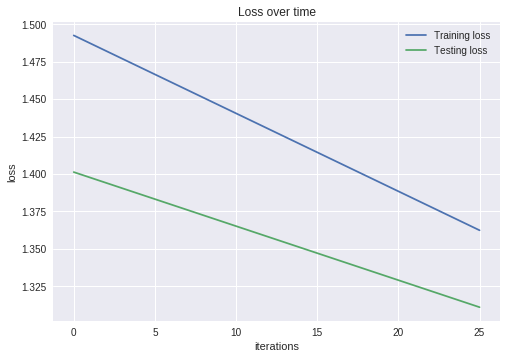

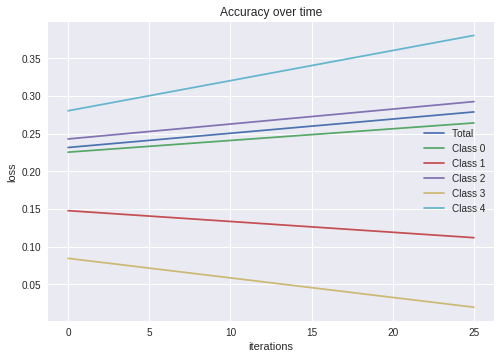

In [0]:
# Train using the original small convolutional net

torch.cuda.empty_cache()
network = HeartbeatNetwork(transform=None)

losses_train, losses_test, accuracy, per_class_accuracy = [], [], [], []
train_heartbeat(network, losses_train=losses_train, losses_test=losses_test, accuracy=accuracy, per_class_accuracy=per_class_accuracy,
                epochs=1, weight=torch.tensor([.4,1,1,1,1]), plot_every=1, graph_skip=25, downsample=.2)

epoch: 1, averaged loss: 0.6143, accuracy: 0.6477, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 24.91it/s]
epoch: 2, averaged loss: 0.5811, accuracy: 0.6841, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 25.06it/s]
epoch: 3, averaged loss: 0.5440, accuracy: 0.6900, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 24.78it/s]


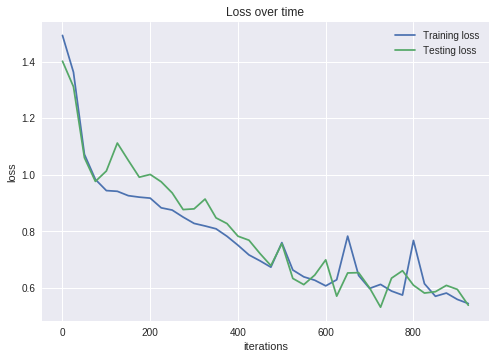

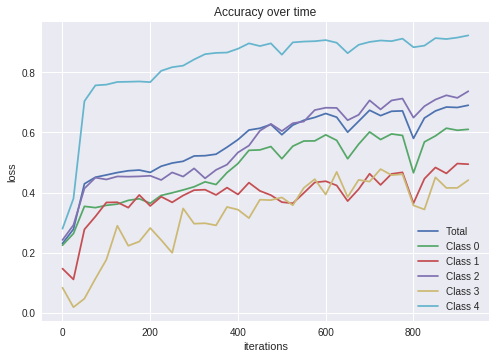

/usr/local/lib/python3.6/dist-packages/torch/serialization.py:250: UserWarning: Couldn't retrieve source code for container of type HeartbeatNetwork. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
epoch: 1, averaged loss: 0.5301, accuracy: 0.6930, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 25.12it/s]
epoch: 2, averaged loss: 0.5355, accuracy: 0.7031, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 25.11it/s]
epoch: 3, averaged loss: 0.5201, accuracy: 0.7190, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 22.90it/s]


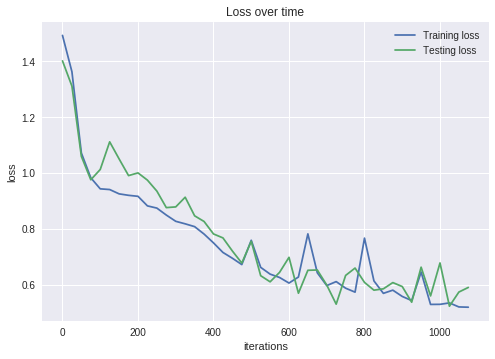

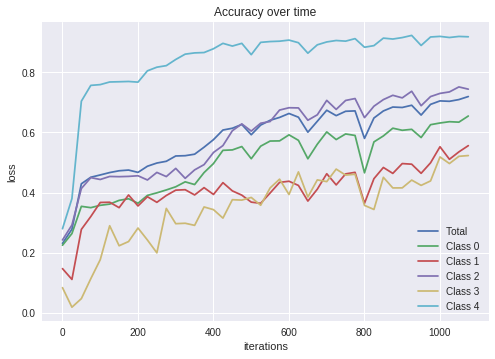

epoch: 1, averaged loss: 0.5165, accuracy: 0.7082, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 23.77it/s]
epoch: 2, averaged loss: 0.5116, accuracy: 0.7161, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 23.93it/s]
epoch: 3, averaged loss: 0.5007, accuracy: 0.7278, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 25.09it/s]


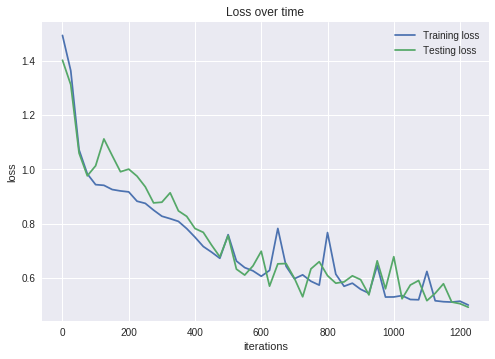

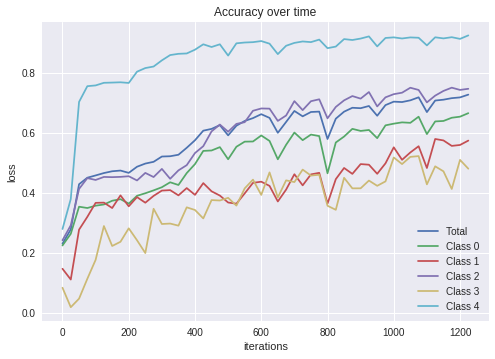

epoch: 1, averaged loss: 0.4961, accuracy: 0.7250, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 22.85it/s]
epoch: 2, averaged loss: 0.4859, accuracy: 0.7287, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 20.79it/s]
epoch: 3, averaged loss: 0.4774, accuracy: 0.7347, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 24.04it/s]


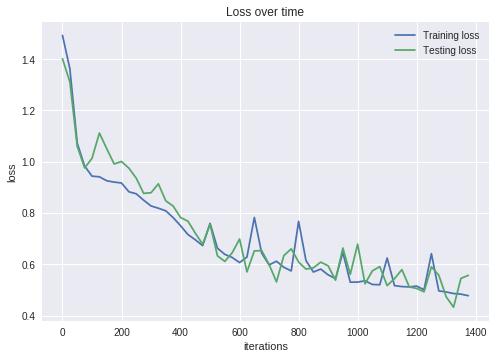

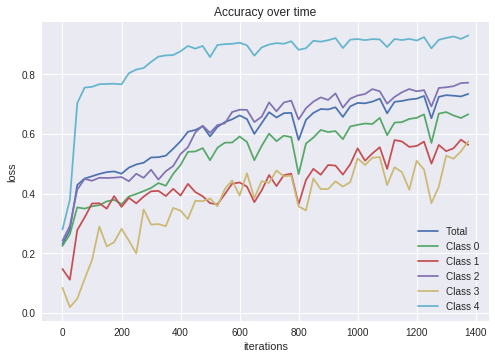

epoch: 1, averaged loss: 0.4688, accuracy: 0.7418, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 23.92it/s]
epoch: 2, averaged loss: 0.4646, accuracy: 0.7390, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 25.03it/s]
epoch: 3, averaged loss: 0.4710, accuracy: 0.7486, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 25.20it/s]


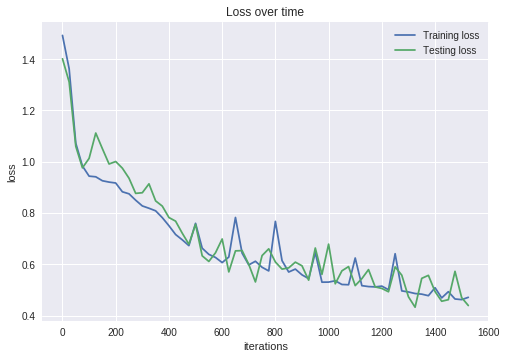

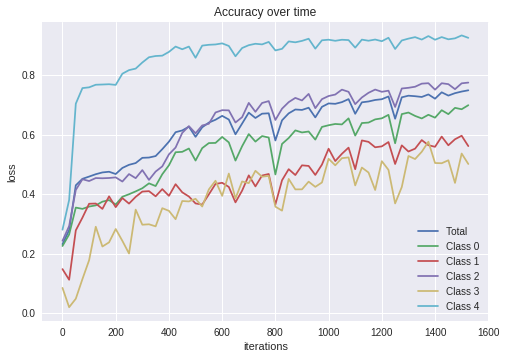

epoch: 1, averaged loss: 0.4727, accuracy: 0.7477, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 25.13it/s]
epoch: 2, averaged loss: 0.4531, accuracy: 0.7481, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 25.10it/s]
epoch: 3, averaged loss: 0.4639, accuracy: 0.7415, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 24.96it/s]


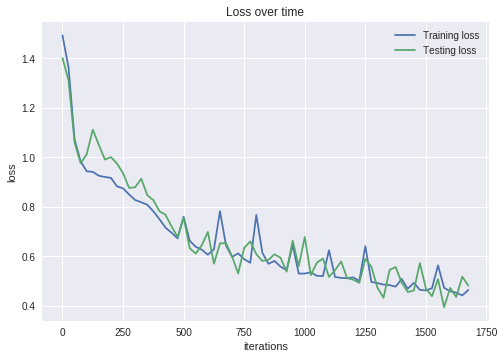

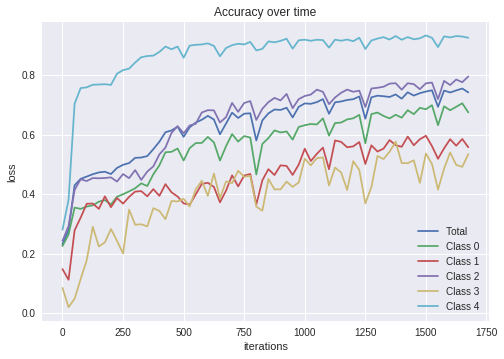

epoch: 1, averaged loss: 0.4496, accuracy: 0.7480, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 22.86it/s]
epoch: 2, averaged loss: 0.4499, accuracy: 0.7603, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 23.93it/s]
epoch: 3, averaged loss: 0.4365, accuracy: 0.7711, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 23.88it/s]


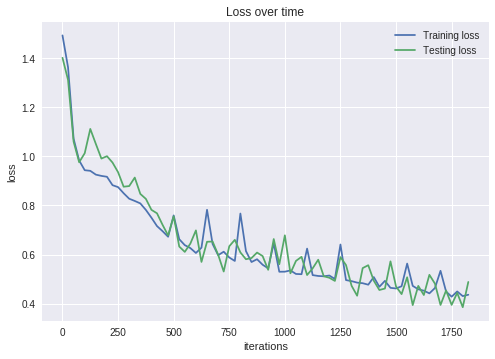

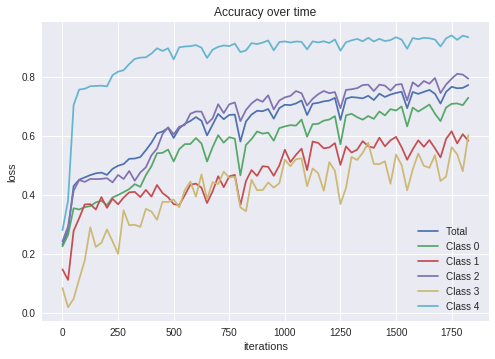

epoch: 1, averaged loss: 0.4409, accuracy: 0.7542, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 24.84it/s]
epoch: 2, averaged loss: 0.4335, accuracy: 0.7612, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 25.03it/s]
epoch: 3, averaged loss: 0.4235, accuracy: 0.7685, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 24.00it/s]


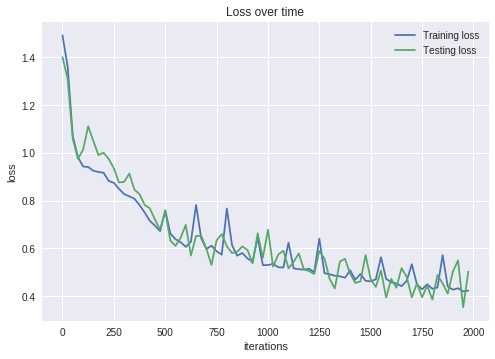

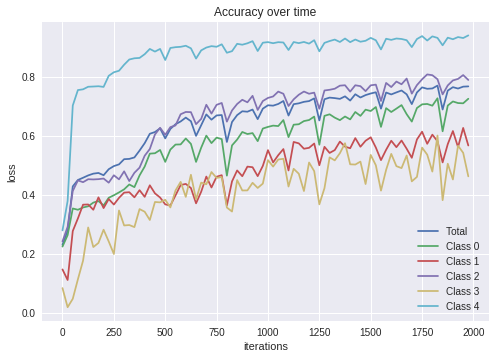

epoch: 1, averaged loss: 0.4226, accuracy: 0.7658, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 25.26it/s]
epoch: 2, averaged loss: 0.4119, accuracy: 0.7741, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 24.85it/s]
epoch: 3, averaged loss: 0.4047, accuracy: 0.7771, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 23.93it/s]


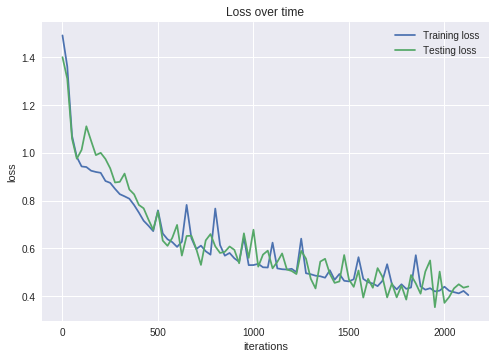

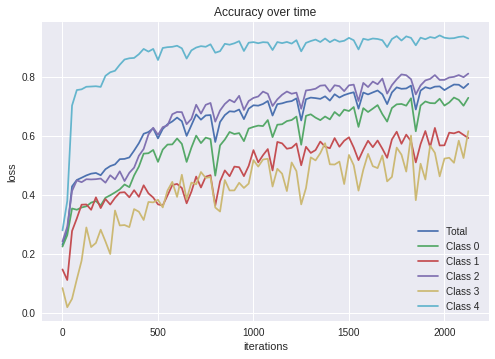

epoch: 1, averaged loss: 0.4020, accuracy: 0.7819, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 21.87it/s]
epoch: 2, averaged loss: 0.3956, accuracy: 0.7791, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 25.06it/s]
epoch: 3, averaged loss: 0.3958, accuracy: 0.7782, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 24.19it/s]


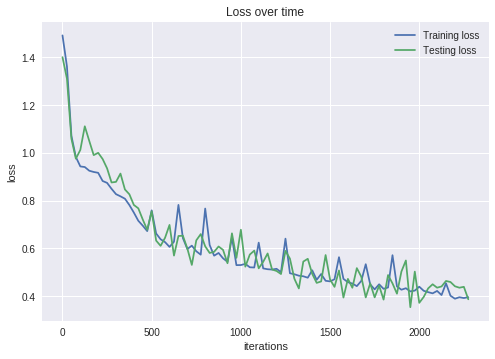

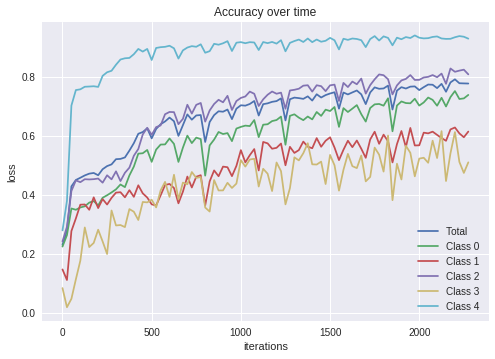

epoch: 1, averaged loss: 0.3808, accuracy: 0.7849, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 23.84it/s]
epoch: 2, averaged loss: 0.3954, accuracy: 0.7827, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 25.12it/s]
epoch: 3, averaged loss: 0.3696, accuracy: 0.7950, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 25.01it/s]


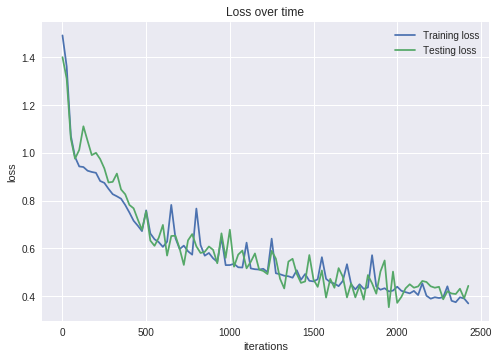

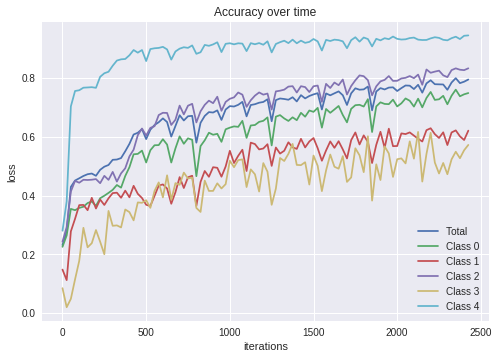

epoch: 1, averaged loss: 0.3834, accuracy: 0.7934, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 23.81it/s]
epoch: 2, averaged loss: 0.3759, accuracy: 0.7890, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 23.77it/s]
epoch: 3, averaged loss: 0.3803, accuracy: 0.7967, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 25.22it/s]


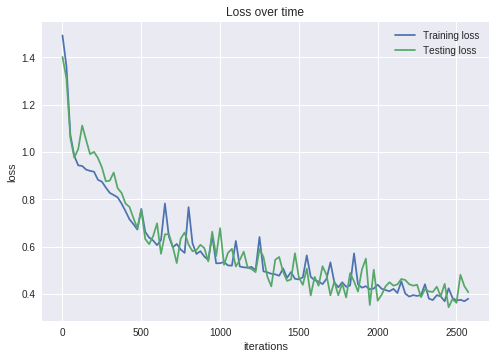

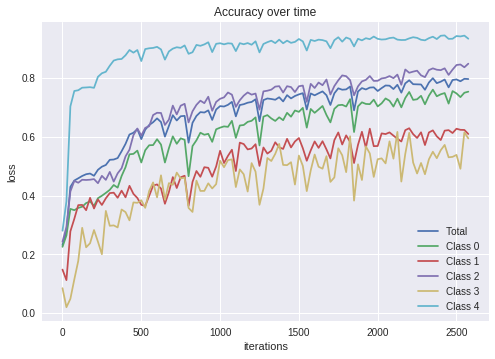

epoch: 1, averaged loss: 0.3666, accuracy: 0.7943, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 22.46it/s]
epoch: 2, averaged loss: 0.3634, accuracy: 0.8022, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 23.93it/s]
epoch: 3, averaged loss: 0.3560, accuracy: 0.8098, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 23.20it/s]


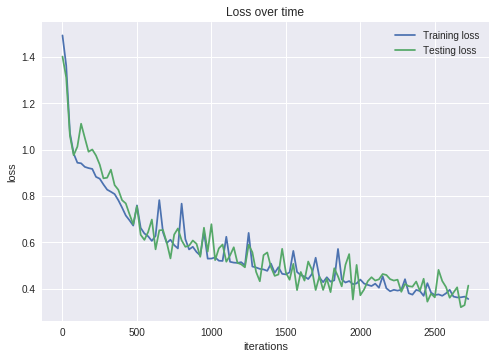

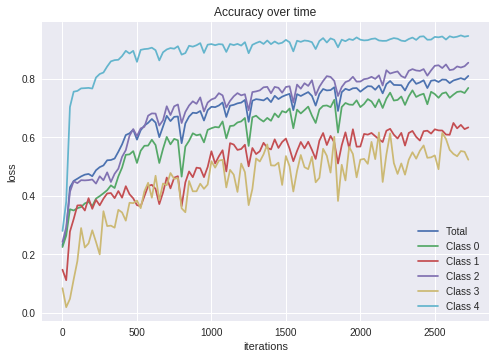

epoch: 1, averaged loss: 0.3547, accuracy: 0.8013, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 25.19it/s]
epoch: 2, averaged loss: 0.3730, accuracy: 0.7989, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 23.94it/s]
epoch: 3, averaged loss: 0.3613, accuracy: 0.8079, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 24.93it/s]


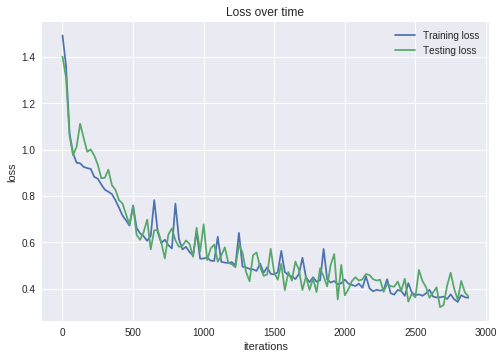

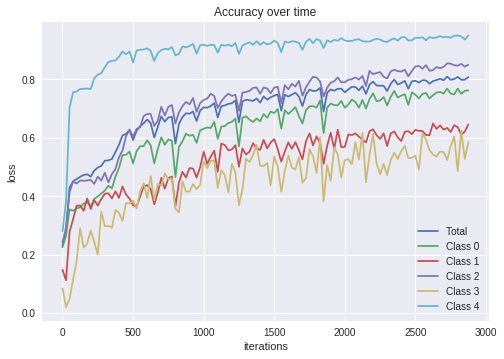

epoch: 1, averaged loss: 0.3424, accuracy: 0.8097, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 25.02it/s]
epoch: 2, averaged loss: 0.3484, accuracy: 0.8125, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 21.19it/s]
epoch: 3, averaged loss: 0.3443, accuracy: 0.8139, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 24.99it/s]


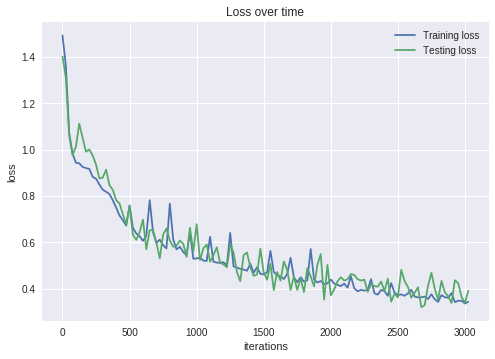

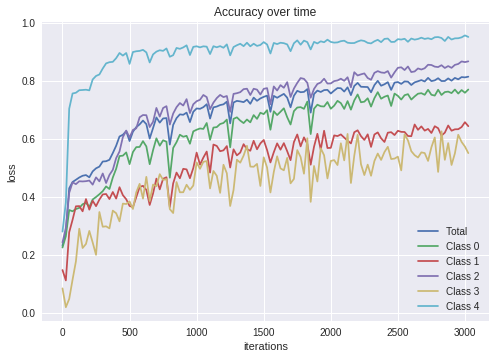

epoch: 1, averaged loss: 0.3518, accuracy: 0.8128, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 24.17it/s]
epoch: 2, averaged loss: 0.3314, accuracy: 0.8151, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 24.92it/s]
epoch: 3, averaged loss: 0.3345, accuracy: 0.8190, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 24.00it/s]


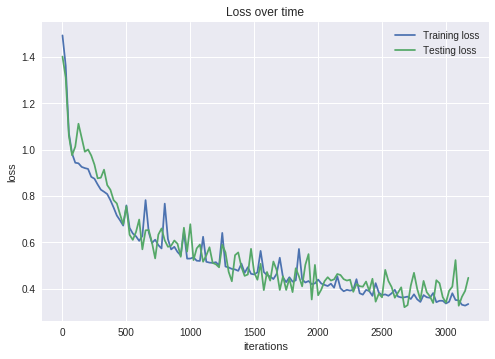

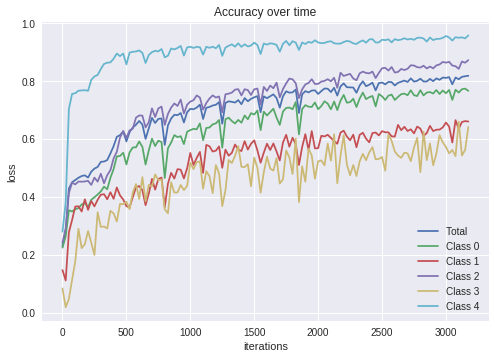

epoch: 1, averaged loss: 0.3463, accuracy: 0.8052, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 23.86it/s]
epoch: 2, averaged loss: 0.3420, accuracy: 0.8135, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 22.98it/s]
epoch: 3, averaged loss: 0.3239, accuracy: 0.8159, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 25.10it/s]


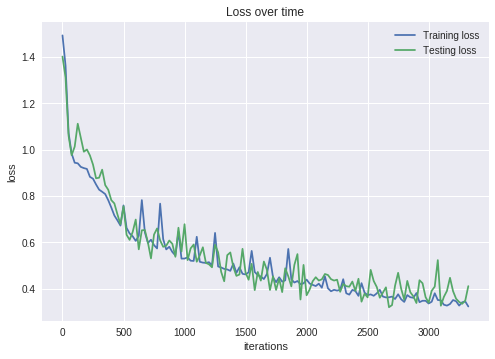

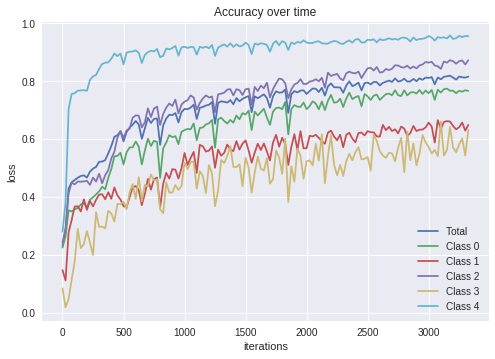

epoch: 1, averaged loss: 0.3301, accuracy: 0.8181, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 24.80it/s]
epoch: 2, averaged loss: 0.3163, accuracy: 0.8238, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 24.95it/s]
epoch: 3, averaged loss: 0.3255, accuracy: 0.8238, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 23.86it/s]


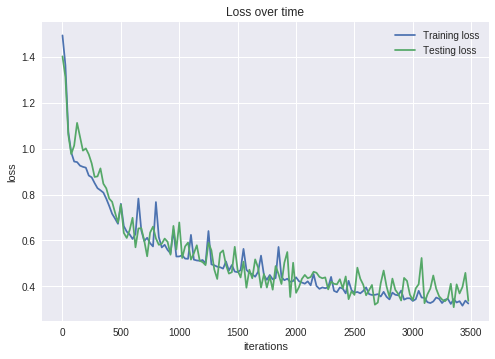

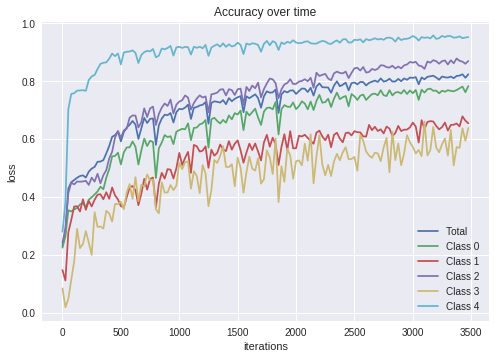

epoch: 1, averaged loss: 0.3139, accuracy: 0.8256, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 22.00it/s]
epoch: 2, averaged loss: 0.3097, accuracy: 0.8304, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 23.83it/s]
epoch: 3, averaged loss: 0.3322, accuracy: 0.8170, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 23.86it/s]


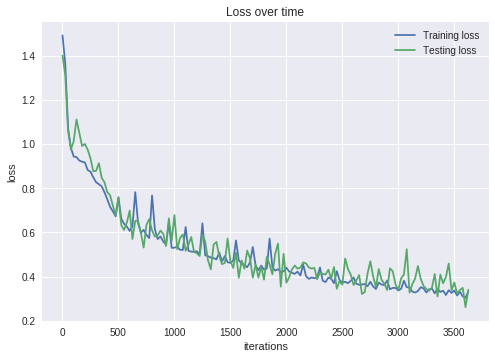

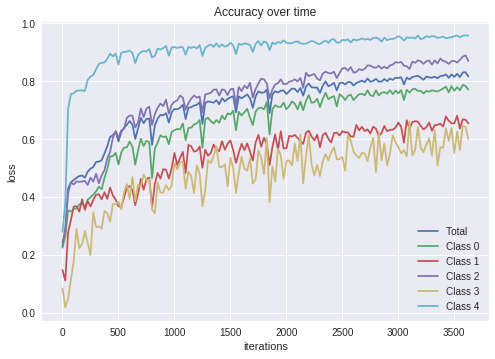

epoch: 1, averaged loss: 0.3257, accuracy: 0.8246, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 23.91it/s]
epoch: 2, averaged loss: 0.3069, accuracy: 0.8377, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 24.00it/s]
epoch: 3, averaged loss: 0.3063, accuracy: 0.8276, gpu usage: 0.00%: 100%|██████████| 60/60 [00:02<00:00, 23.88it/s]


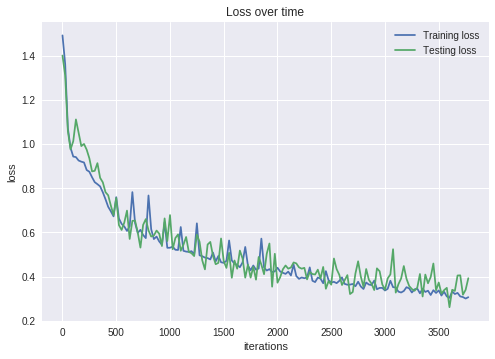

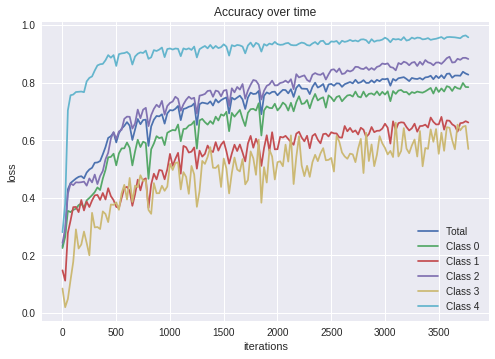

In [0]:
var_dict = dict()

for i in range(20):
  train_heartbeat(network, losses_train=losses_train, losses_test=losses_test, accuracy=accuracy, per_class_accuracy=per_class_accuracy,
                epochs=3, weight=torch.tensor([.4,1.3,1,1.3,1]), plot_every=3, graph_skip=25, downsample=.2)
  
  var_dict['model'] = network
  var_dict['losses_train'] = losses_train
  var_dict['losses_test'] = losses_test
  var_dict['accuracy'] = accuracy
  var_dict['per_class_accuracy'] = per_class_accuracy

  torch.save(var_dict, root+'/simple_conv_balanced_classes_no_transform.pt')

### Resnet

In [0]:
class ResBlock(nn.Module):
  """
  A simple ResNet block with batch normalization and 1d convolutions. 
  Output channels is the same as input channels
  """
  def __init__(self, kernel_size, padding, channels):
    super(ResBlock, self).__init__()
    self.block =  nn.Sequential(nn.BatchNorm1d(channels),
                              nn.ReLU(),
                              nn.Conv1d(channels, channels, kernel_size=kernel_size, padding=padding),
                              nn.BatchNorm1d(channels),
                              nn.ReLU(),
                              nn.Conv1d(channels, channels, kernel_size=kernel_size, padding=padding))
    
  def forward(self, x):
    return self.block(x)
  
#_______________________________________________________________________________________________________________________________________
  
class ResNet(nn.Module):
  def __init__(self, output_classes=5, transform=None, block_count=5, kernel_size=3, padding=1, block_type=ResBlock, block_channels=16):
    """"""
    super(ResNet, self).__init__()
    self.transform = transform
    self.output_classes = output_classes
    self.input_channels = 1
    self.block_count = block_count
    
    # input channels changes depending on what kind of transform is used
    if transform is linear_interp_dwt:
      self.input_channels = 6
      
    # initial layer
    self.inp = nn.Sequential(nn.Conv1d(self.input_channels, block_channels, kernel_size=kernel_size, padding=padding))
    
    # the bulk of the network is composed of these blocks
    self.blocks = []
    for i in range(block_count):
      self.blocks += [block_type(kernel_size=kernel_size, padding=padding, channels=block_channels).cuda()] #.cuda since array elements are not automatically moved to cuda
    
    
    # finally a linear layer and softmax for class selection
    self.linear = nn.Sequential(nn.Conv1d(block_channels, 1, kernel_size=kernel_size, padding=padding),
                              nn.Linear(187,output_classes))
    self.log_softm = nn.LogSoftmax(dim=1)
                             
  def forward(self, x):
    # initial reshaping convolutional layer
    out1 = self.inp(x)
    
    # blocks
    for i in range(self.block_count):
      out1 = out1 + self.blocks[i](out1)
    
    # linear and softmax
    out = self.linear(out1).squeeze()
    return self.log_softm(out)
  

epoch: 1, averaged loss: 1.1278, accuracy: 0.3782, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.40it/s]


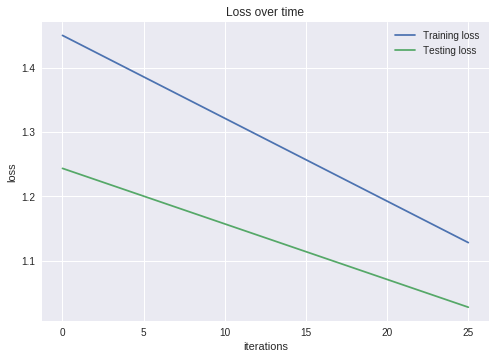

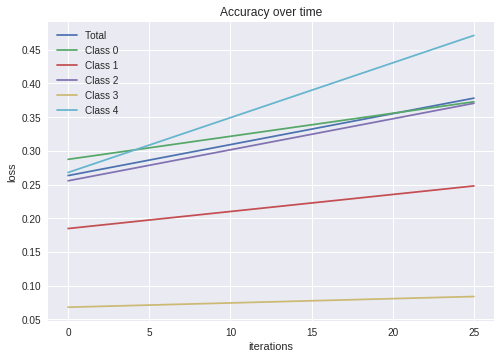

In [0]:
# Train using a standard ResNet architecture

torch.cuda.empty_cache()
network = ResNet(transform=None,block_count=12, block_channels=24)

losses_train, losses_test, accuracy, per_class_accuracy = [], [], [], []
train_heartbeat(network, losses_train=losses_train, losses_test=losses_test, accuracy=accuracy, per_class_accuracy=per_class_accuracy,
                epochs=1, weight=torch.tensor([.4,1.3,1,1.3,1]), plot_every=1, graph_skip=25, downsample=.2)

epoch: 1, averaged loss: 0.6676, accuracy: 0.6147, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.38it/s]
epoch: 2, averaged loss: 0.5724, accuracy: 0.6758, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.55it/s]
epoch: 3, averaged loss: 0.5296, accuracy: 0.6897, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]


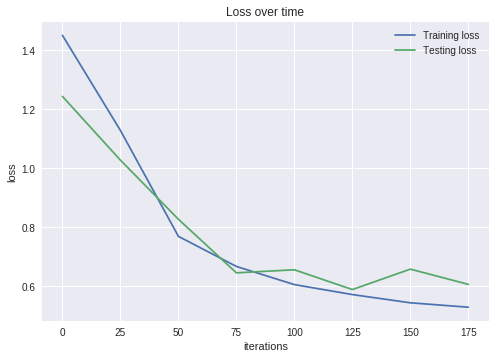

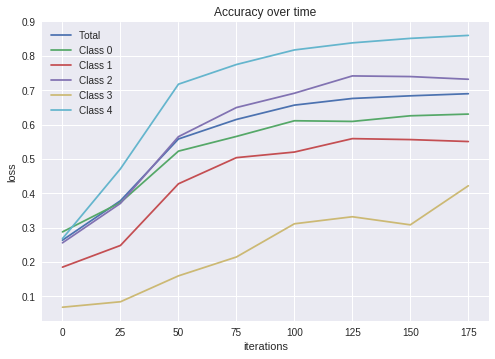

/usr/local/lib/python3.6/dist-packages/torch/serialization.py:250: UserWarning: Couldn't retrieve source code for container of type ResNet. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:250: UserWarning: Couldn't retrieve source code for container of type ResBlock. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
epoch: 1, averaged loss: 0.5111, accuracy: 0.7080, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.41it/s]
epoch: 2, averaged loss: 0.4795, accuracy: 0.7219, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]
epoch: 3, averaged loss: 0.4669, accuracy: 0.7231, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]


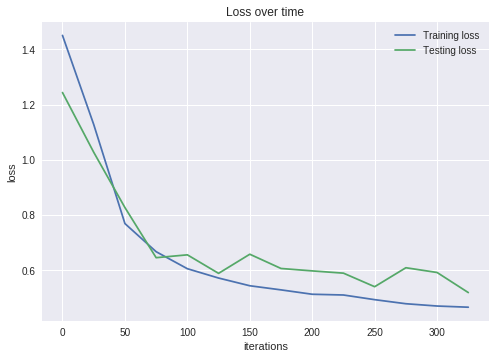

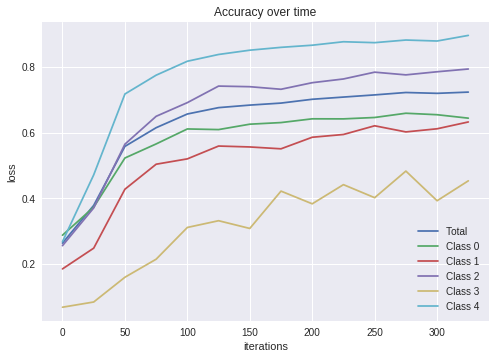

epoch: 1, averaged loss: 0.4560, accuracy: 0.7358, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.35it/s]
epoch: 2, averaged loss: 0.4548, accuracy: 0.7396, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]
epoch: 3, averaged loss: 0.4517, accuracy: 0.7372, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]


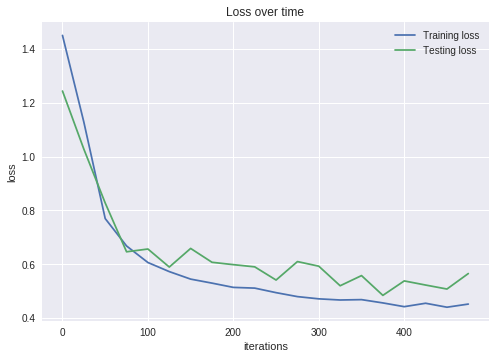

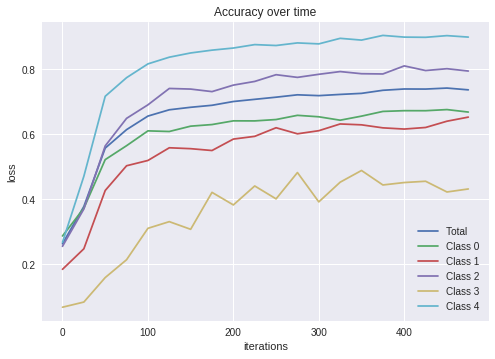

epoch: 1, averaged loss: 0.4270, accuracy: 0.7478, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.43it/s]
epoch: 2, averaged loss: 0.4334, accuracy: 0.7493, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.51it/s]
epoch: 3, averaged loss: 0.4228, accuracy: 0.7540, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]


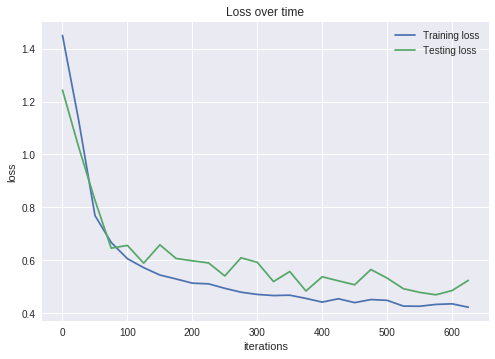

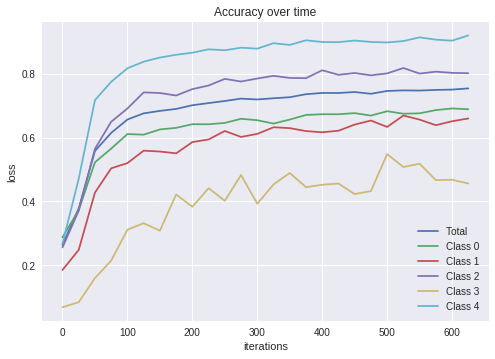

epoch: 1, averaged loss: 0.4268, accuracy: 0.7519, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.39it/s]
epoch: 2, averaged loss: 0.4314, accuracy: 0.7551, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]
epoch: 3, averaged loss: 0.4302, accuracy: 0.7545, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]


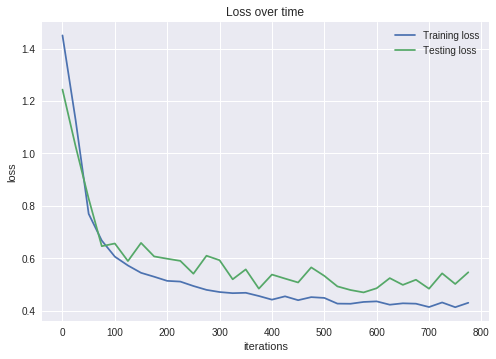

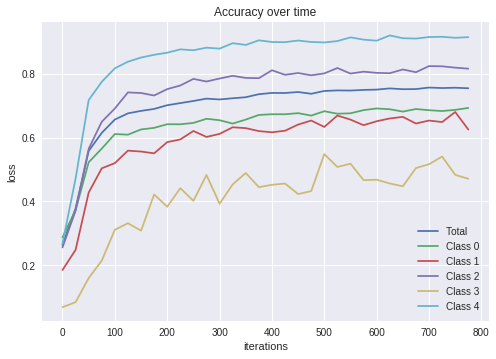

epoch: 1, averaged loss: 0.4135, accuracy: 0.7561, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]
epoch: 2, averaged loss: 0.4014, accuracy: 0.7587, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]
epoch: 3, averaged loss: 0.4071, accuracy: 0.7614, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]


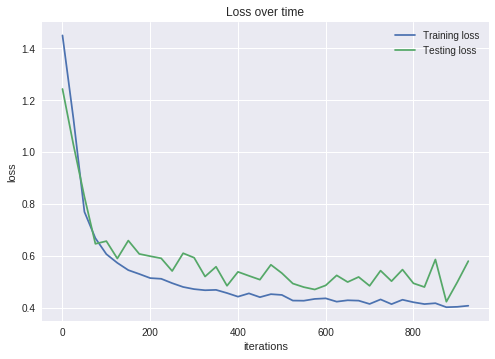

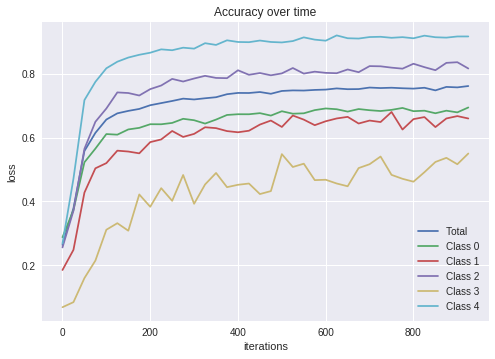

epoch: 1, averaged loss: 0.3977, accuracy: 0.7651, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.37it/s]
epoch: 2, averaged loss: 0.3852, accuracy: 0.7687, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]
epoch: 3, averaged loss: 0.3933, accuracy: 0.7697, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]


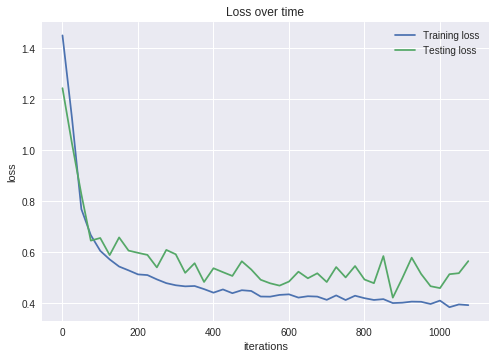

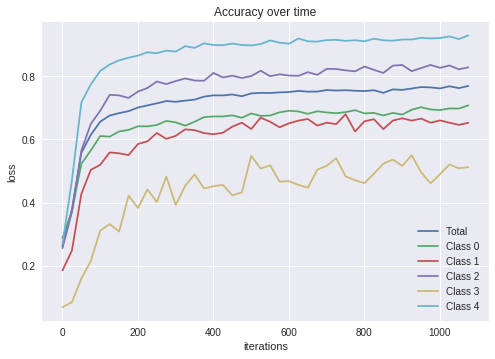

epoch: 1, averaged loss: 0.3979, accuracy: 0.7662, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.51it/s]
epoch: 2, averaged loss: 0.3866, accuracy: 0.7742, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]
epoch: 3, averaged loss: 0.3897, accuracy: 0.7715, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]


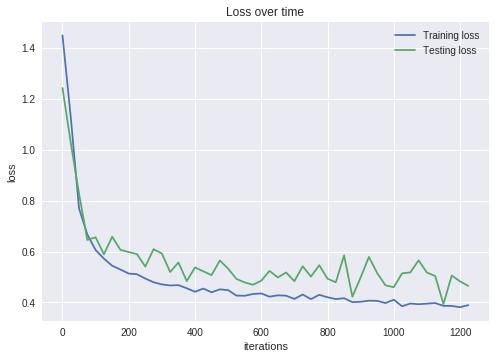

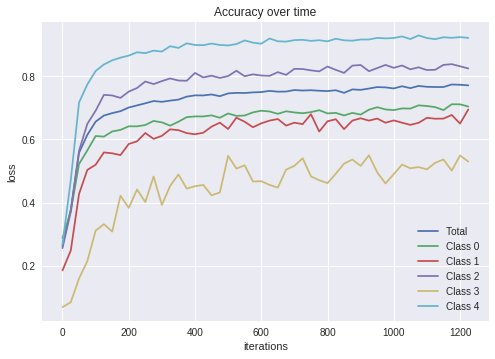

epoch: 1, averaged loss: 0.3767, accuracy: 0.7816, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.41it/s]
epoch: 2, averaged loss: 0.3749, accuracy: 0.7704, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.55it/s]
epoch: 3, averaged loss: 0.3765, accuracy: 0.7863, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.41it/s]


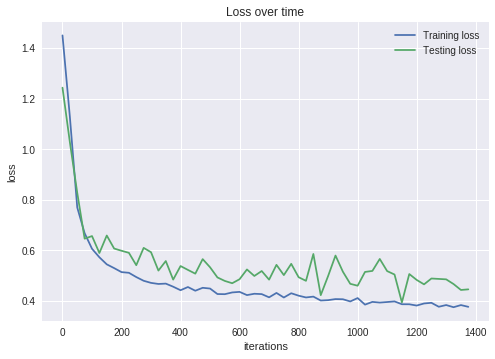

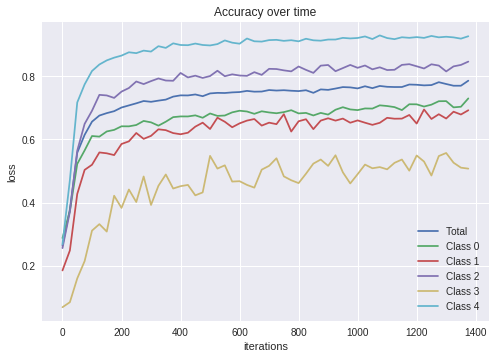

epoch: 1, averaged loss: 0.3722, accuracy: 0.7857, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]
epoch: 2, averaged loss: 0.3707, accuracy: 0.7824, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]
epoch: 3, averaged loss: 0.3720, accuracy: 0.7815, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.51it/s]


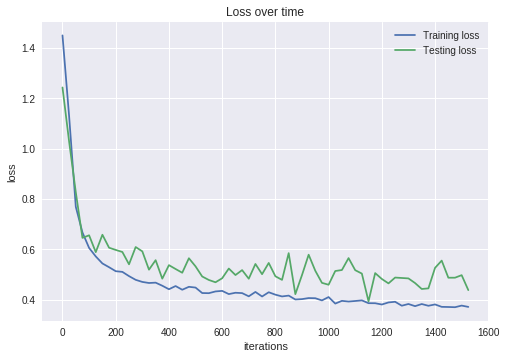

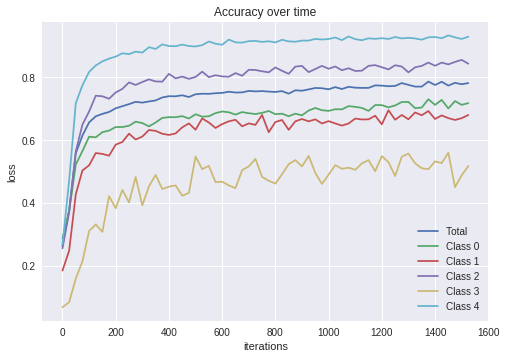

epoch: 1, averaged loss: 0.3804, accuracy: 0.7773, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.42it/s]
epoch: 2, averaged loss: 0.3631, accuracy: 0.7795, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.41it/s]
epoch: 3, averaged loss: 0.3667, accuracy: 0.7870, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]


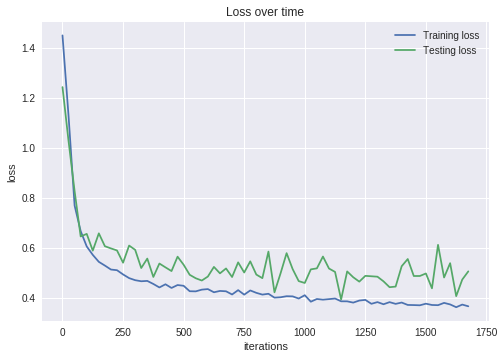

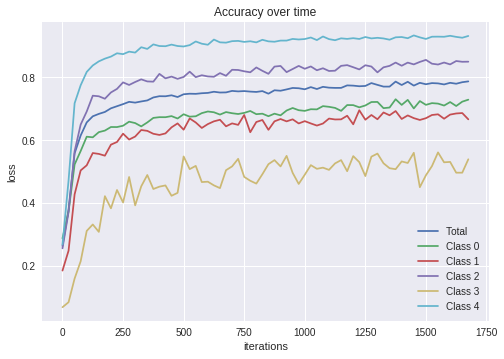

epoch: 1, averaged loss: 0.3735, accuracy: 0.7752, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]
epoch: 2, averaged loss: 0.3882, accuracy: 0.7798, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]
epoch: 3, averaged loss: 0.3768, accuracy: 0.7766, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]


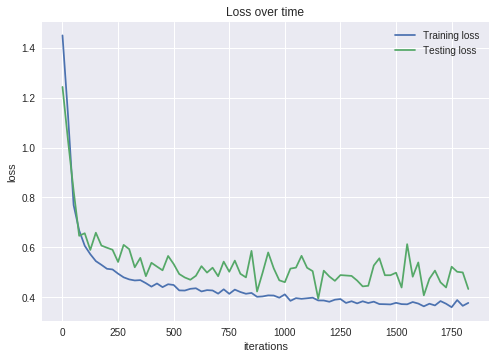

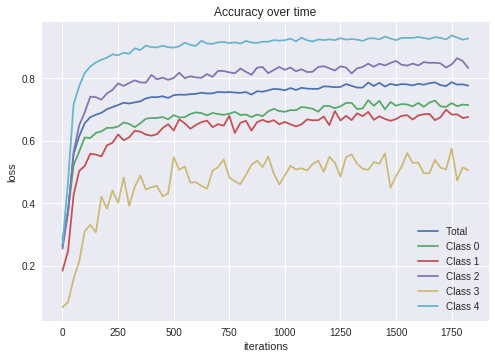

epoch: 1, averaged loss: 0.3631, accuracy: 0.7806, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.40it/s]
epoch: 2, averaged loss: 0.3529, accuracy: 0.7878, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.41it/s]
epoch: 3, averaged loss: 0.3721, accuracy: 0.7848, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.50it/s]


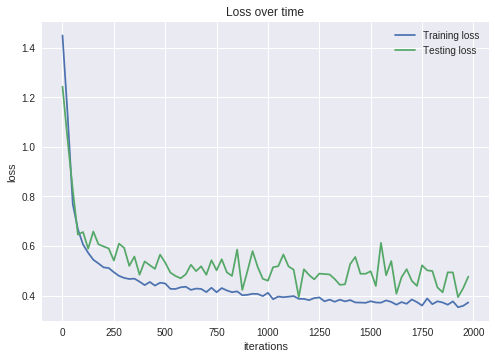

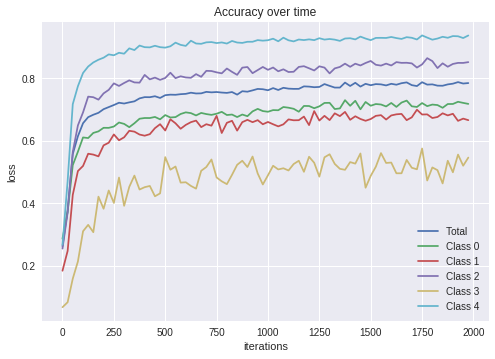

epoch: 1, averaged loss: 0.3618, accuracy: 0.7864, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]
epoch: 2, averaged loss: 0.3572, accuracy: 0.7870, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]
epoch: 3, averaged loss: 0.3663, accuracy: 0.7854, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]


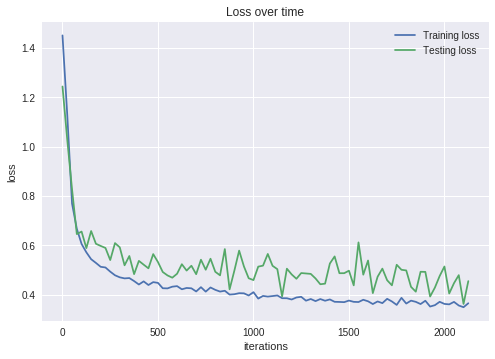

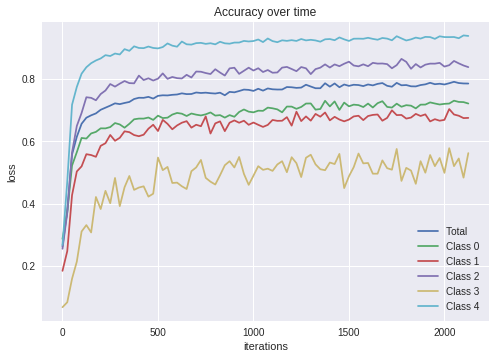

epoch: 1, averaged loss: 0.3554, accuracy: 0.7859, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.27it/s]
epoch: 2, averaged loss: 0.3556, accuracy: 0.7926, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]
epoch: 3, averaged loss: 0.3588, accuracy: 0.7908, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]


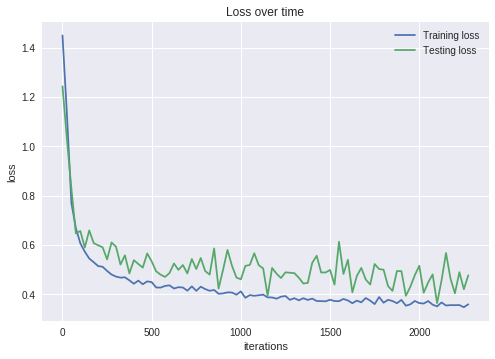

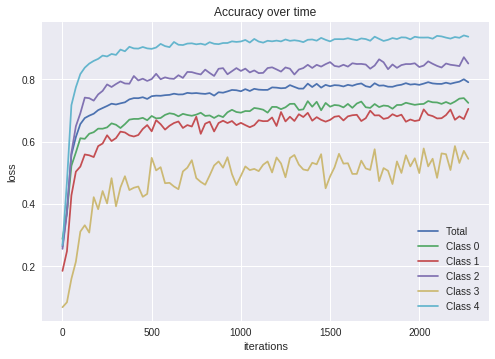

epoch: 1, averaged loss: 0.3578, accuracy: 0.7871, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]
epoch: 2, averaged loss: 0.3520, accuracy: 0.7944, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]
epoch: 3, averaged loss: 0.3586, accuracy: 0.7846, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]


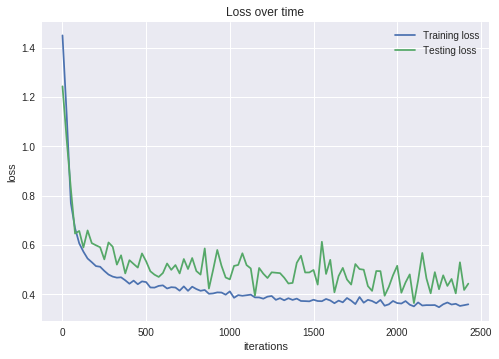

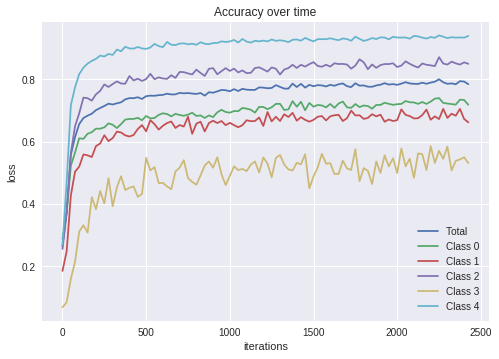

epoch: 1, averaged loss: 0.3500, accuracy: 0.7942, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.41it/s]
epoch: 2, averaged loss: 0.3514, accuracy: 0.7942, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]
epoch: 3, averaged loss: 0.3586, accuracy: 0.7852, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]


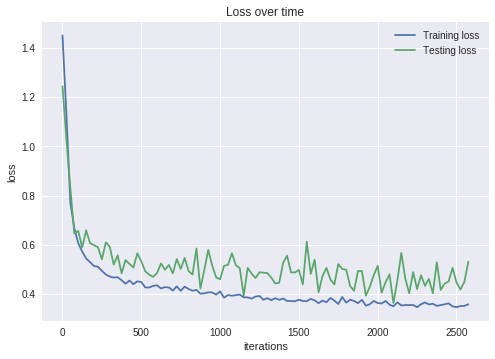

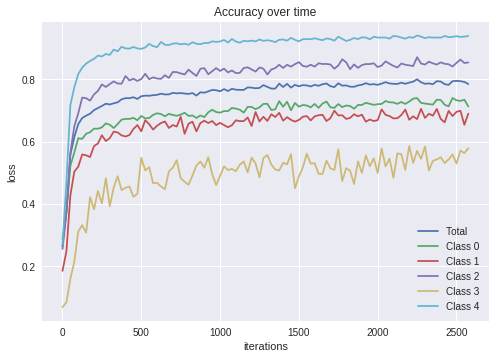

epoch: 1, averaged loss: 0.3461, accuracy: 0.7934, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]
epoch: 2, averaged loss: 0.3543, accuracy: 0.7949, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.50it/s]
epoch: 3, averaged loss: 0.3430, accuracy: 0.8003, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.50it/s]


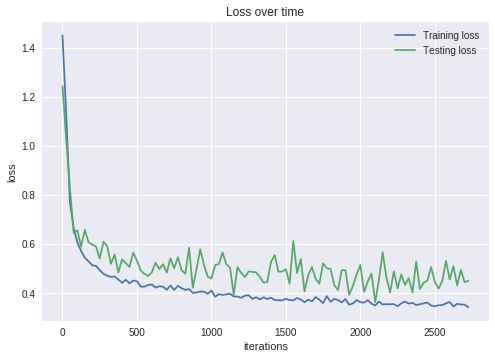

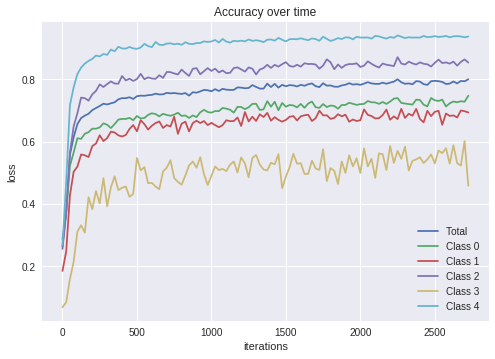

epoch: 1, averaged loss: 0.3488, accuracy: 0.7947, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.41it/s]
epoch: 2, averaged loss: 0.3561, accuracy: 0.7928, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.55it/s]
epoch: 3, averaged loss: 0.3520, accuracy: 0.7946, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]


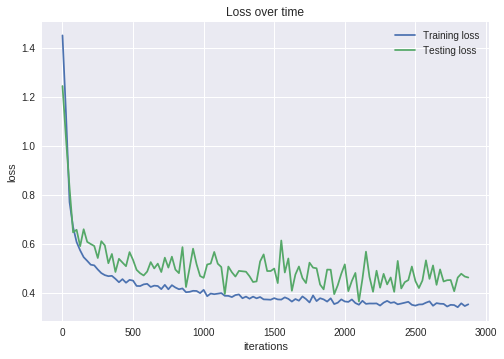

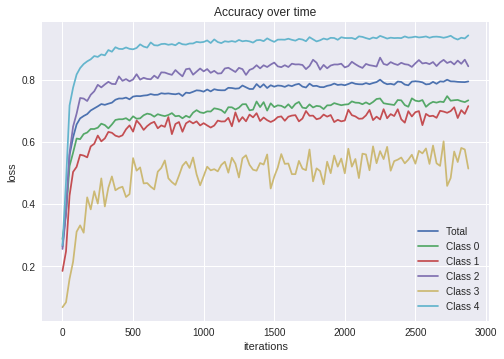

epoch: 1, averaged loss: 0.3473, accuracy: 0.8001, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]
epoch: 2, averaged loss: 0.3357, accuracy: 0.8005, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]
epoch: 3, averaged loss: 0.3447, accuracy: 0.7968, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.44it/s]


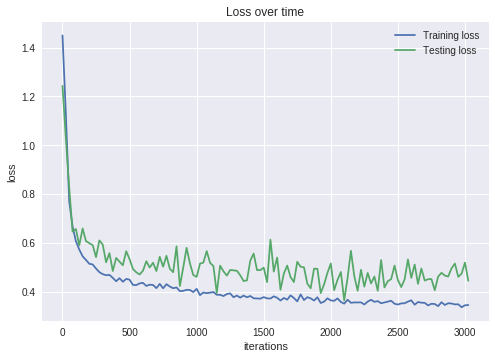

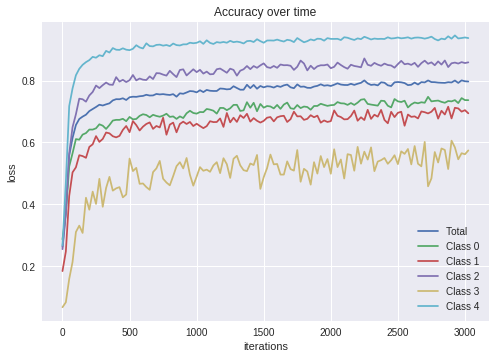

epoch: 1, averaged loss: 0.3443, accuracy: 0.7973, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.44it/s]
epoch: 2, averaged loss: 0.3435, accuracy: 0.7954, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]
epoch: 3, averaged loss: 0.3420, accuracy: 0.7956, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.57it/s]


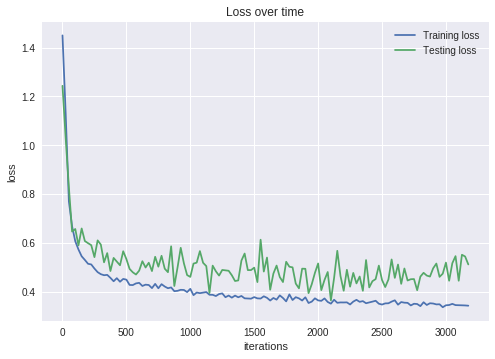

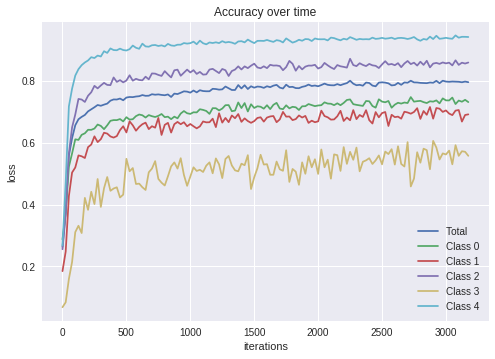

epoch: 1, averaged loss: 0.3458, accuracy: 0.7945, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]
epoch: 2, averaged loss: 0.3425, accuracy: 0.7974, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.43it/s]
epoch: 3, averaged loss: 0.3352, accuracy: 0.7999, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]


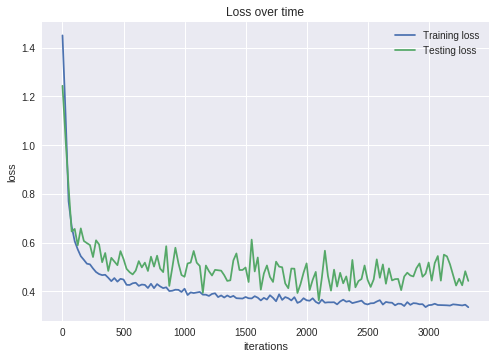

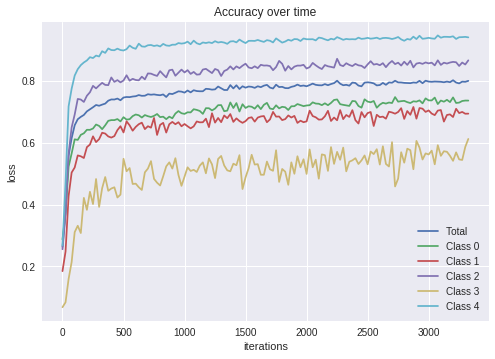

epoch: 1, averaged loss: 0.3437, accuracy: 0.8018, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.41it/s]
epoch: 2, averaged loss: 0.3426, accuracy: 0.8044, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]
epoch: 3, averaged loss: 0.3402, accuracy: 0.7966, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.51it/s]


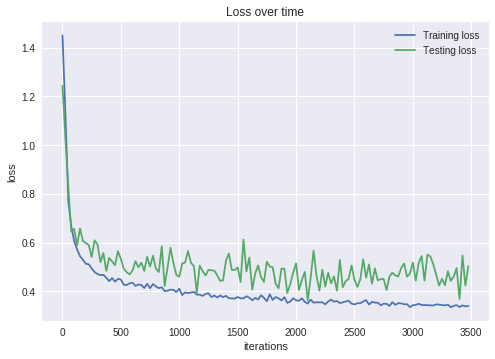

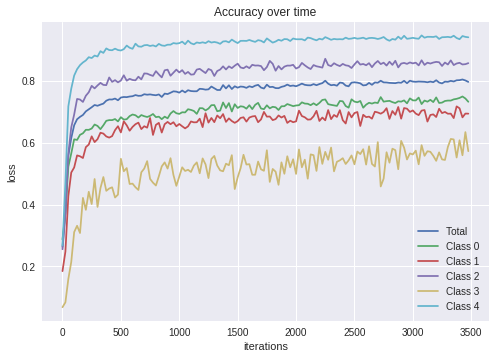

epoch: 1, averaged loss: 0.3395, accuracy: 0.7965, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]
epoch: 2, averaged loss: 0.3274, accuracy: 0.8052, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.43it/s]
epoch: 3, averaged loss: 0.3438, accuracy: 0.7959, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]


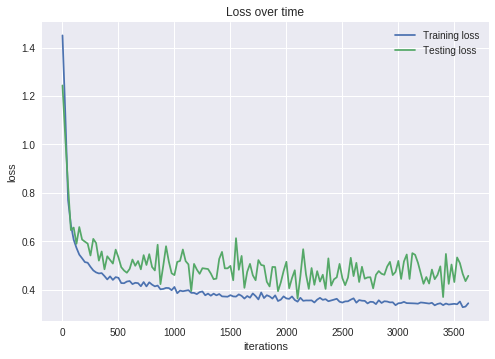

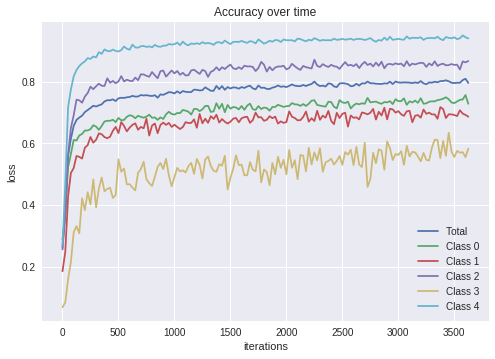

epoch: 1, averaged loss: 0.3363, accuracy: 0.7974, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.36it/s]
epoch: 2, averaged loss: 0.3359, accuracy: 0.7937, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.50it/s]
epoch: 3, averaged loss: 0.3261, accuracy: 0.8076, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]


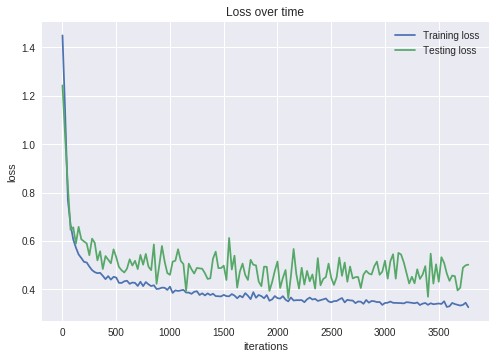

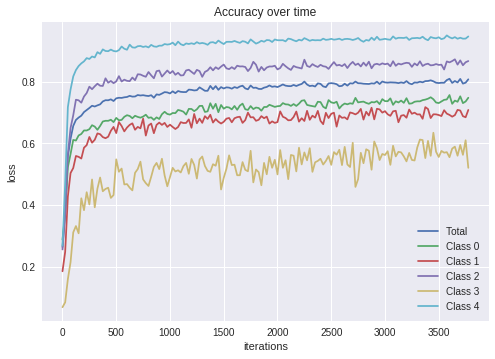

epoch: 1, averaged loss: 0.3350, accuracy: 0.8040, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.45it/s]
epoch: 2, averaged loss: 0.3402, accuracy: 0.7992, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]
epoch: 3, averaged loss: 0.3342, accuracy: 0.7998, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]


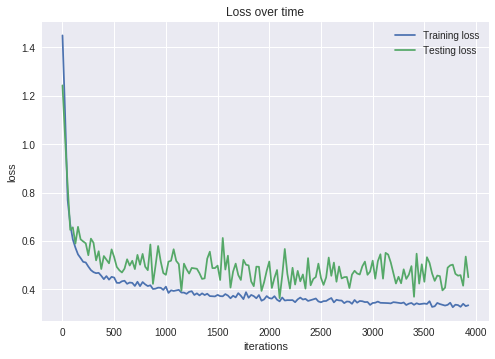

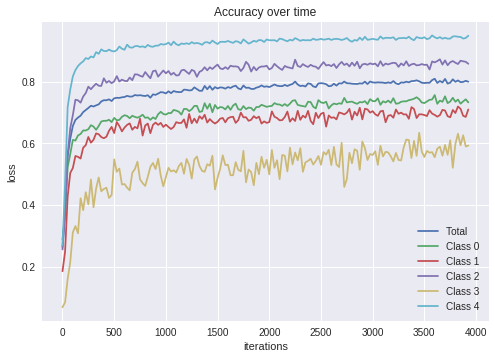

epoch: 1, averaged loss: 0.3398, accuracy: 0.8034, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.39it/s]
epoch: 2, averaged loss: 0.3453, accuracy: 0.7937, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.51it/s]
epoch: 3, averaged loss: 0.3263, accuracy: 0.8018, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]


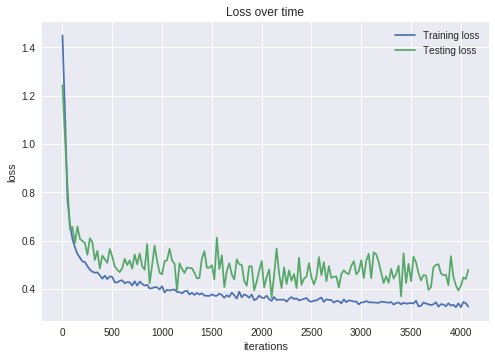

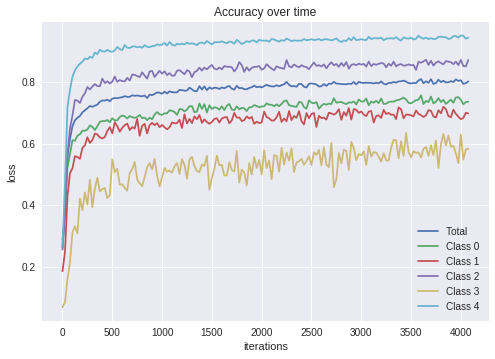

epoch: 1, averaged loss: 0.3384, accuracy: 0.7974, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.55it/s]
epoch: 2, averaged loss: 0.3286, accuracy: 0.7998, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.51it/s]
epoch: 3, averaged loss: 0.3341, accuracy: 0.8055, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]


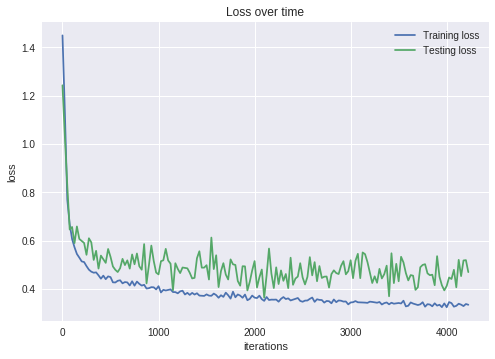

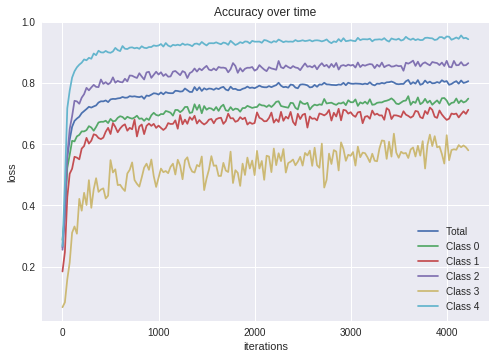

epoch: 1, averaged loss: 0.3248, accuracy: 0.8038, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.37it/s]
epoch: 2, averaged loss: 0.3245, accuracy: 0.8103, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]
epoch: 3, averaged loss: 0.3307, accuracy: 0.8021, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]


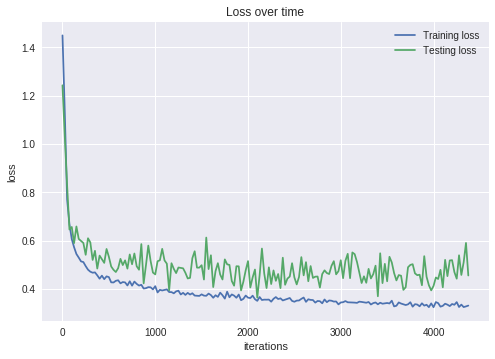

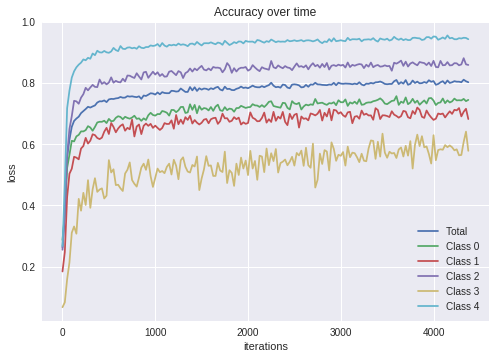

epoch: 1, averaged loss: 0.3305, accuracy: 0.8137, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.51it/s]
epoch: 2, averaged loss: 0.3308, accuracy: 0.8029, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.55it/s]
epoch: 3, averaged loss: 0.3265, accuracy: 0.8107, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]


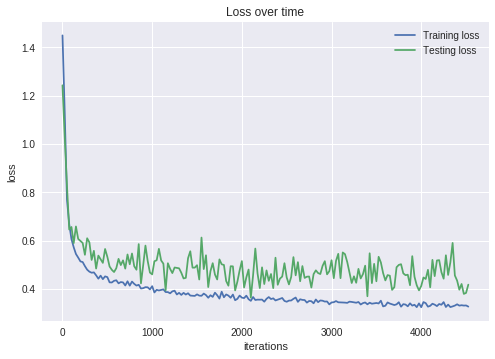

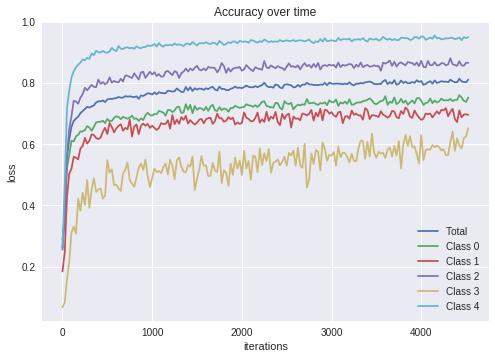

epoch: 1, averaged loss: 0.3281, accuracy: 0.8084, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.40it/s]
epoch: 2, averaged loss: 0.3286, accuracy: 0.8056, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]
epoch: 3, averaged loss: 0.3196, accuracy: 0.8022, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.45it/s]


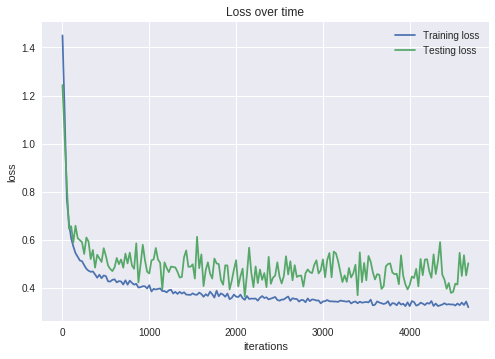

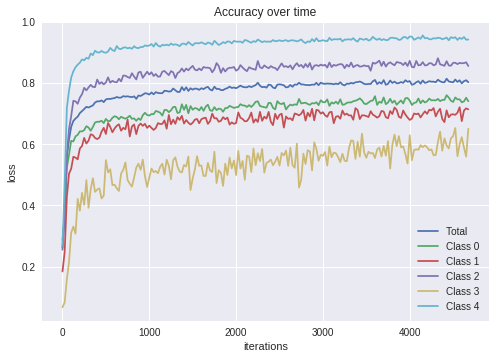

epoch: 1, averaged loss: 0.3283, accuracy: 0.8041, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]
epoch: 2, averaged loss: 0.3352, accuracy: 0.8050, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.50it/s]
epoch: 3, averaged loss: 0.3345, accuracy: 0.8089, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.51it/s]


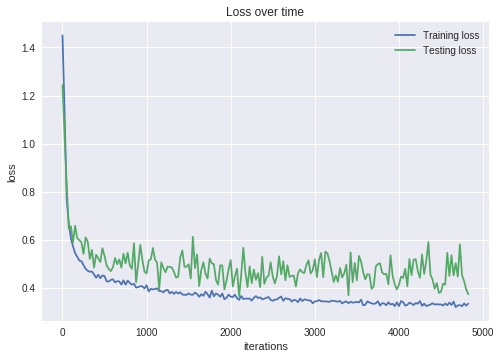

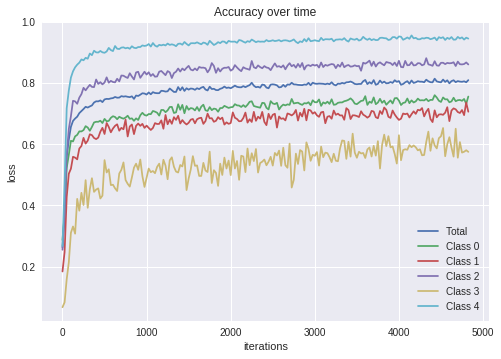

epoch: 1, averaged loss: 0.3330, accuracy: 0.8048, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.36it/s]
epoch: 2, averaged loss: 0.3317, accuracy: 0.8113, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]
epoch: 3, averaged loss: 0.3290, accuracy: 0.8027, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.40it/s]


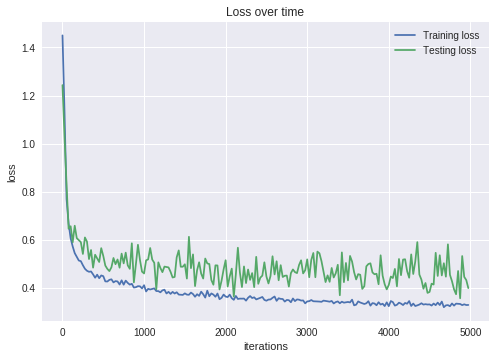

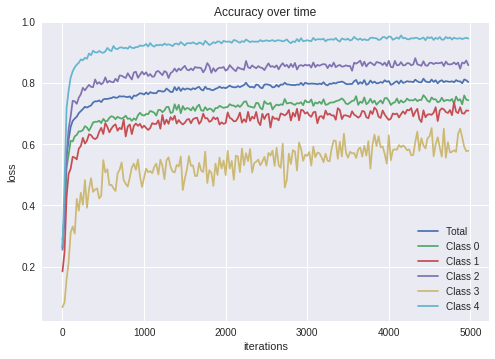

epoch: 1, averaged loss: 0.3313, accuracy: 0.8074, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]
epoch: 2, averaged loss: 0.3359, accuracy: 0.8079, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]
epoch: 3, averaged loss: 0.3264, accuracy: 0.8051, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.50it/s]


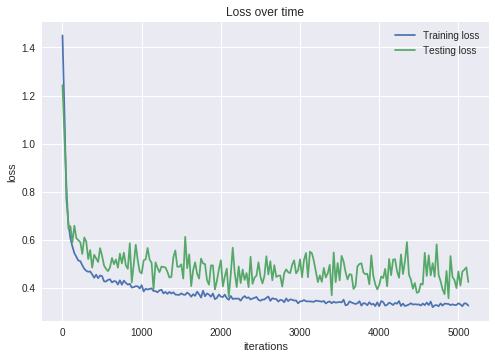

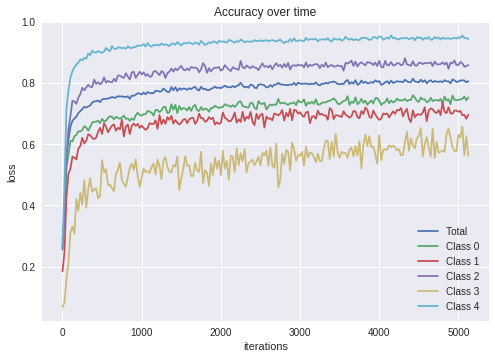

epoch: 1, averaged loss: 0.3278, accuracy: 0.8029, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.41it/s]
epoch: 2, averaged loss: 0.3281, accuracy: 0.8076, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.44it/s]
epoch: 3, averaged loss: 0.3304, accuracy: 0.8075, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]


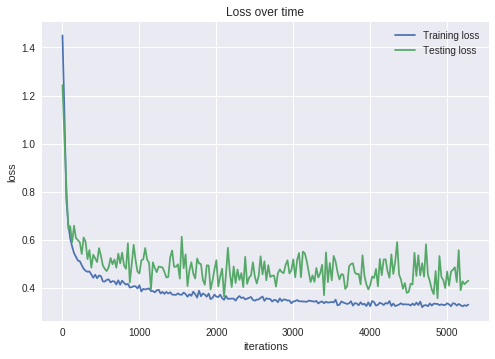

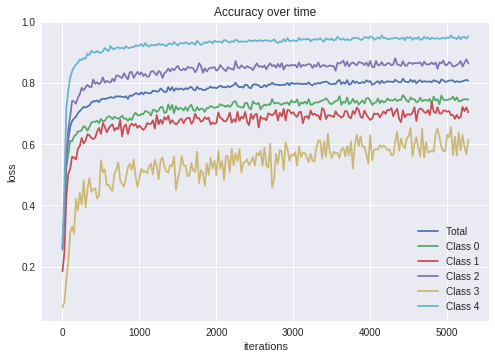

epoch: 1, averaged loss: 0.3245, accuracy: 0.8136, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]
epoch: 2, averaged loss: 0.3179, accuracy: 0.8057, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]
epoch: 3, averaged loss: 0.3413, accuracy: 0.8038, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]


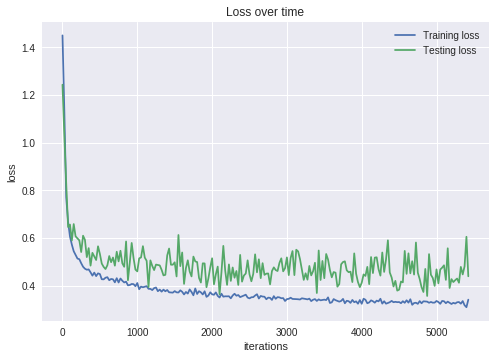

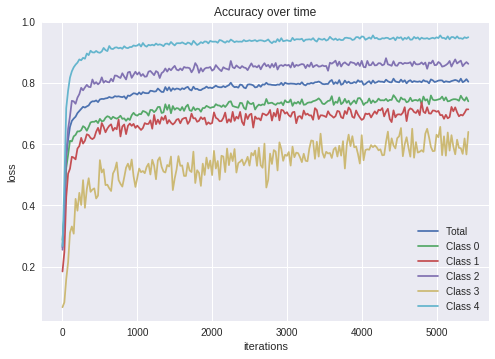

epoch: 1, averaged loss: 0.3238, accuracy: 0.8044, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.24it/s]
epoch: 2, averaged loss: 0.3284, accuracy: 0.8035, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]
epoch: 3, averaged loss: 0.3334, accuracy: 0.8100, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]


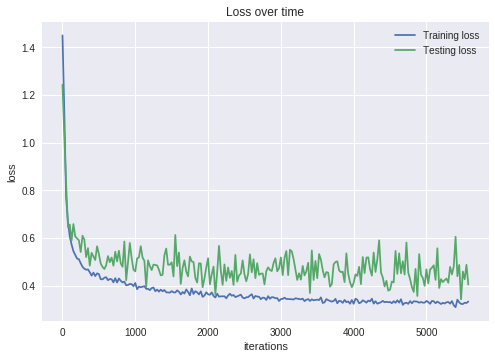

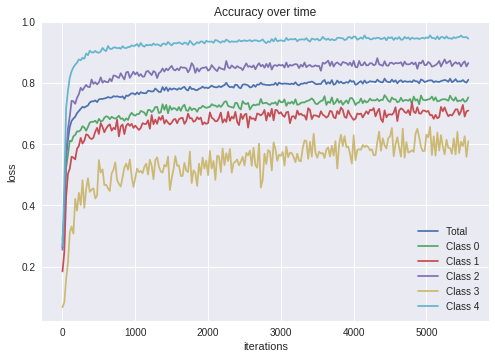

epoch: 1, averaged loss: 0.3329, accuracy: 0.8051, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]
epoch: 2, averaged loss: 0.3292, accuracy: 0.8064, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]
epoch: 3, averaged loss: 0.3416, accuracy: 0.8036, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]


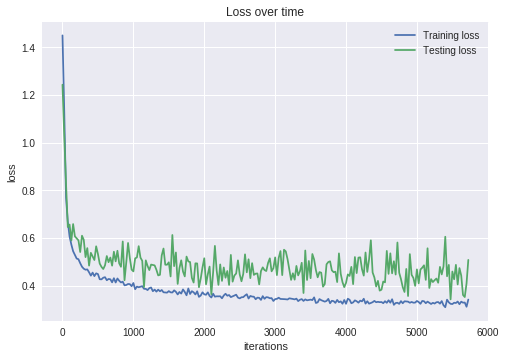

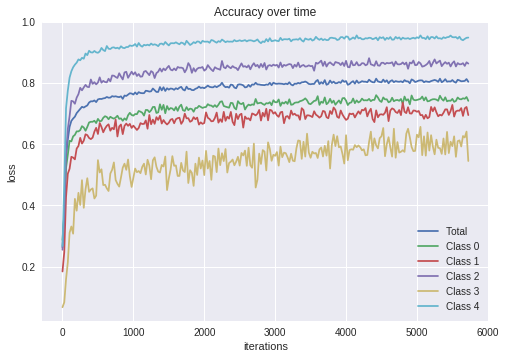

epoch: 1, averaged loss: 0.3213, accuracy: 0.8145, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.31it/s]
epoch: 2, averaged loss: 0.3282, accuracy: 0.8134, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]
epoch: 3, averaged loss: 0.3308, accuracy: 0.8056, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]


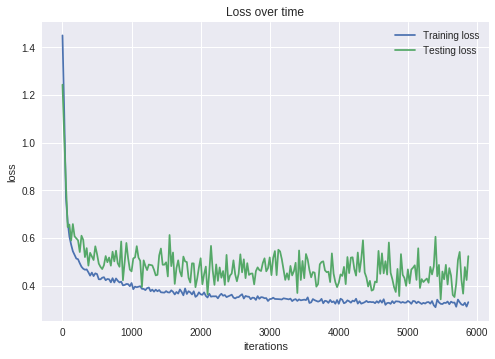

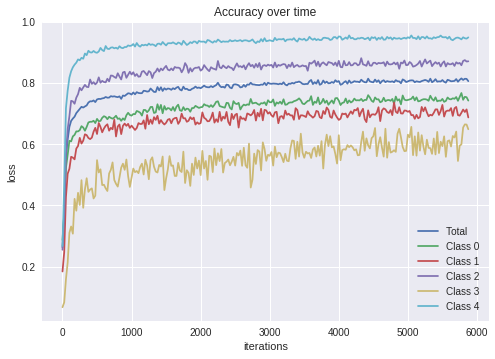

epoch: 1, averaged loss: 0.3252, accuracy: 0.8030, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]
epoch: 2, averaged loss: 0.3277, accuracy: 0.8060, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]
epoch: 3, averaged loss: 0.3241, accuracy: 0.8048, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]


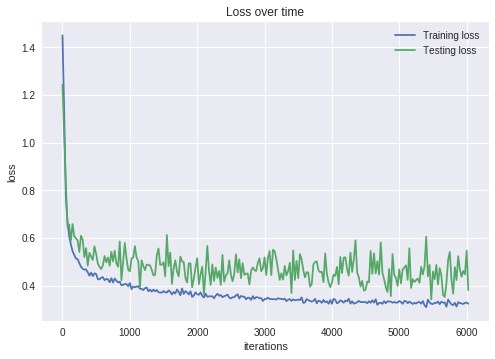

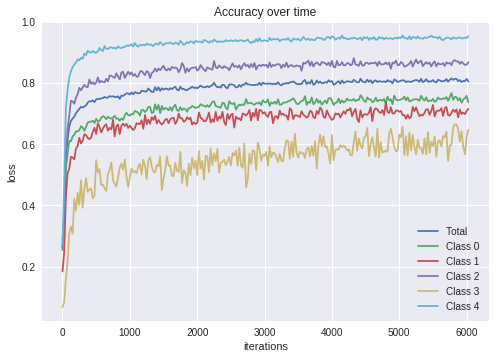

epoch: 1, averaged loss: 0.3236, accuracy: 0.8104, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.41it/s]
epoch: 2, averaged loss: 0.3344, accuracy: 0.8042, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]
epoch: 3, averaged loss: 0.3156, accuracy: 0.8121, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]


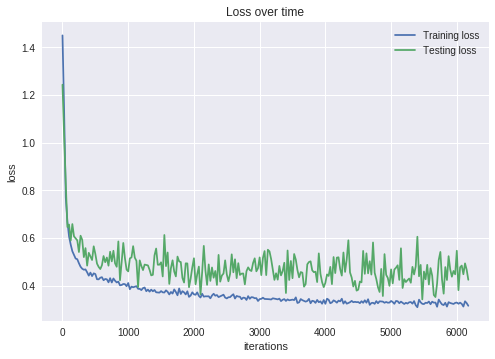

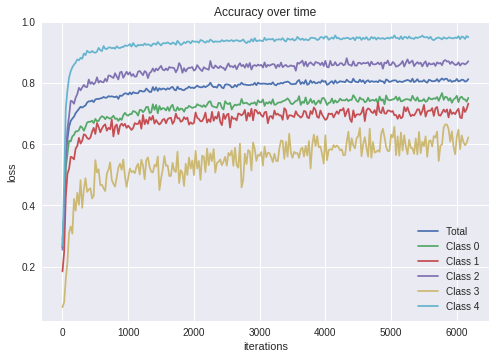

epoch: 1, averaged loss: 0.3276, accuracy: 0.8058, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]
epoch: 2, averaged loss: 0.3292, accuracy: 0.8057, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]
epoch: 3, averaged loss: 0.3228, accuracy: 0.8130, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]


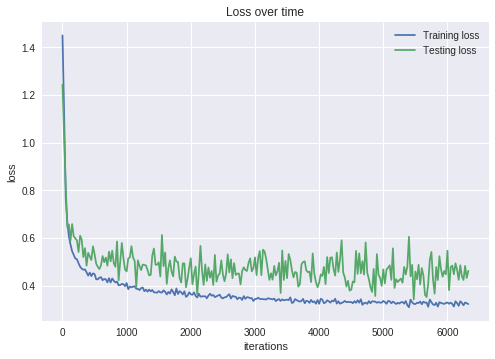

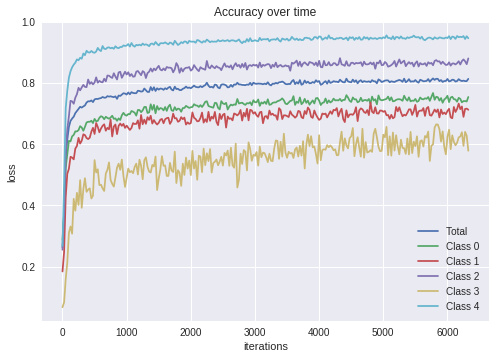

epoch: 1, averaged loss: 0.3304, accuracy: 0.8083, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.40it/s]
epoch: 2, averaged loss: 0.3321, accuracy: 0.8111, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]
epoch: 3, averaged loss: 0.3244, accuracy: 0.8049, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]


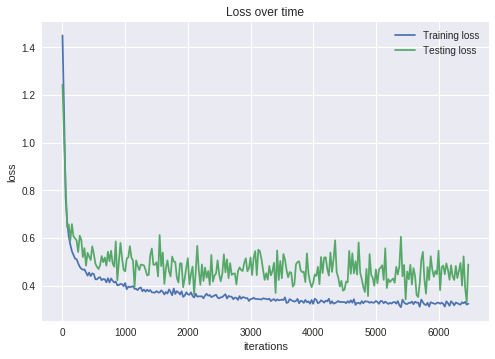

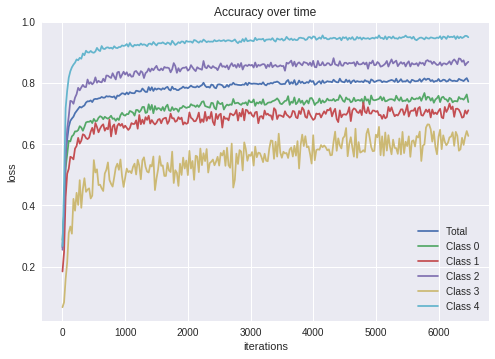

epoch: 1, averaged loss: 0.3226, accuracy: 0.8088, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]
epoch: 2, averaged loss: 0.3220, accuracy: 0.8010, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]
epoch: 3, averaged loss: 0.3184, accuracy: 0.8106, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.42it/s]


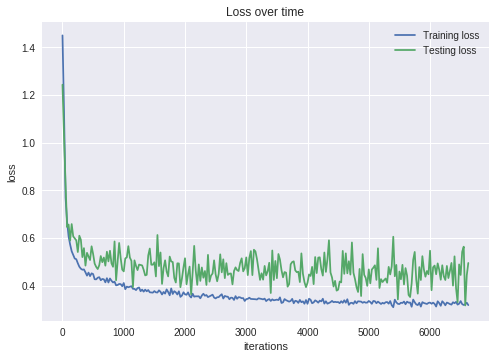

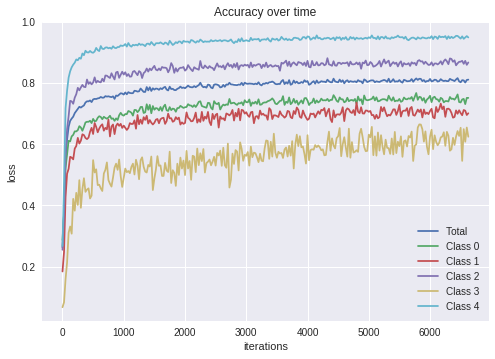

epoch: 1, averaged loss: 0.3182, accuracy: 0.8086, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.42it/s]
epoch: 2, averaged loss: 0.3198, accuracy: 0.8091, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]
epoch: 3, averaged loss: 0.3210, accuracy: 0.8050, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.56it/s]


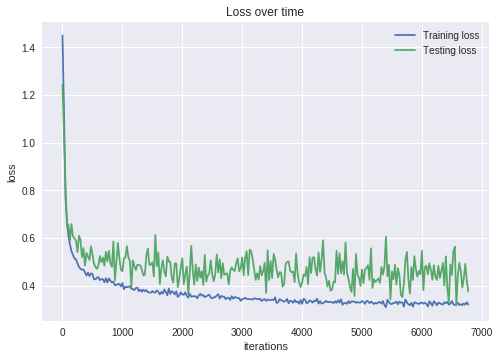

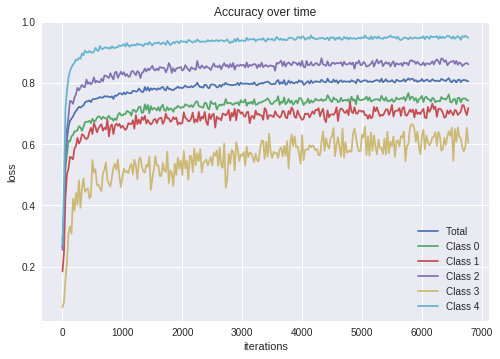

epoch: 1, averaged loss: 0.3305, accuracy: 0.8065, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.55it/s]
epoch: 2, averaged loss: 0.3207, accuracy: 0.8025, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.44it/s]
epoch: 3, averaged loss: 0.3163, accuracy: 0.8115, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.55it/s]


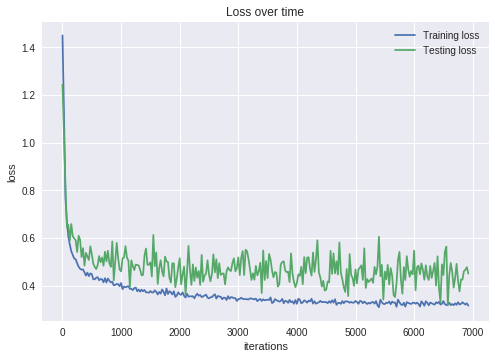

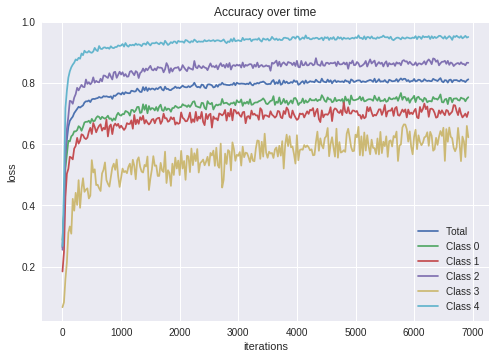

epoch: 1, averaged loss: 0.3345, accuracy: 0.8060, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.38it/s]
epoch: 2, averaged loss: 0.3279, accuracy: 0.8048, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]
epoch: 3, averaged loss: 0.3349, accuracy: 0.8078, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]


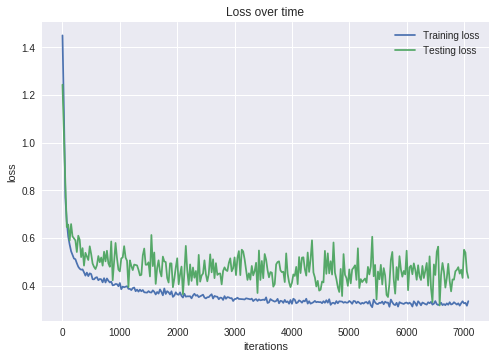

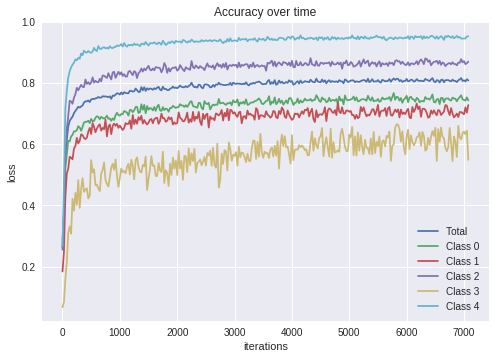

epoch: 1, averaged loss: 0.3193, accuracy: 0.8131, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]
epoch: 2, averaged loss: 0.3425, accuracy: 0.8010, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.45it/s]
epoch: 3, averaged loss: 0.3376, accuracy: 0.8034, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.54it/s]


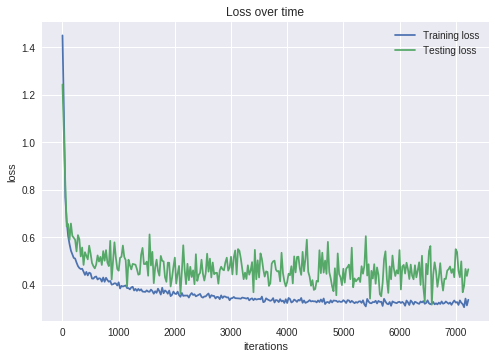

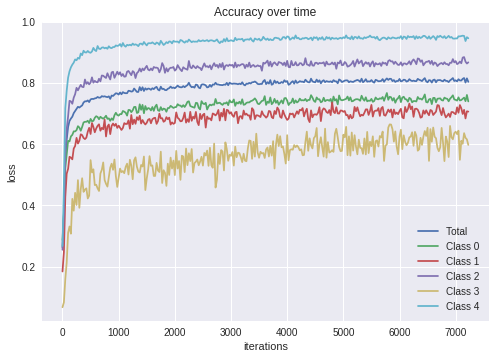

epoch: 1, averaged loss: 0.3313, accuracy: 0.8068, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.40it/s]
epoch: 2, averaged loss: 0.3215, accuracy: 0.8044, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]
epoch: 3, averaged loss: 0.3279, accuracy: 0.8044, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.52it/s]


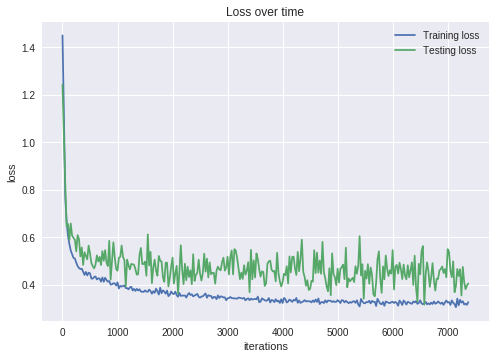

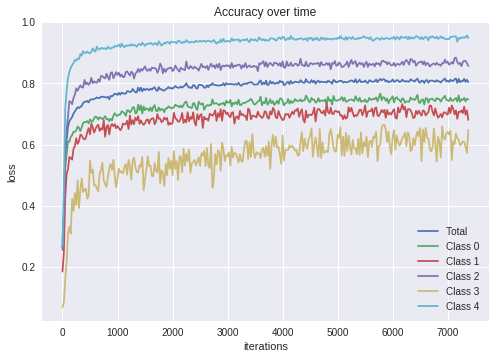

epoch: 1, averaged loss: 0.3269, accuracy: 0.8074, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.43it/s]
epoch: 2, averaged loss: 0.3210, accuracy: 0.8102, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.55it/s]
epoch: 3, averaged loss: 0.3232, accuracy: 0.8105, gpu usage: 0.00%: 100%|██████████| 60/60 [00:07<00:00,  8.53it/s]


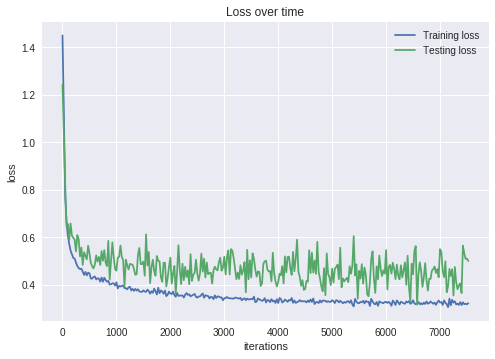

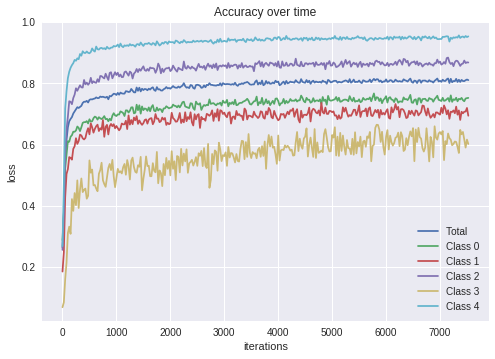

In [0]:
var_dict = dict()

for i in range(50):
  train_heartbeat(network, losses_train=losses_train, losses_test=losses_test, accuracy=accuracy, per_class_accuracy=per_class_accuracy,
                epochs=3, weight=torch.tensor([.4,1.3,1,1.3,1]), plot_every=3, graph_skip=25, downsample=.2)
  
  var_dict['model'] = network
  var_dict['losses_train'] = losses_train
  var_dict['losses_test'] = losses_test
  var_dict['accuracy'] = accuracy
  var_dict['per_class_accuracy'] = per_class_accuracy

  torch.save(var_dict, root+'/ResNet_balanced_classes_no_transform.pt')

### DenseNet

In [0]:
class DenseNet(nn.Module):
  """
  see https://towardsdatascience.com/densenet-2810936aeebb
  A simple DenseNet implementation.
  Includes dropout and transition layers.
  """
  def __init__(self, transform=None, start_channels=12, output_classes=5, n_per_block=4, nblocks=3, growthRate=4, bottleneck=False, reduce_constant=1/2,
              kernel_size_avg_pool=2, padding_avg_pool=0, pooling=False, linear_in=187):
    super(DenseNet, self).__init__()
    
    self.transform = transform
    self.output_classes = output_classes
    in_channels = 1
    
    # input channels changes depending on what kind of transform is used
    if transform is linear_interp_dwt:
      in_channels = 6
    
    self.inp = nn.Conv1d(in_channels, start_channels, kernel_size=3, padding=1)
    nChannels = start_channels
    
    blocks = []
    for i in range(nblocks):
      layers = []
      
      for i in range(n_per_block):
        if bottleneck:
          layers += [BottleneckLayer(nChannels, growthRate)]
        else:
          layers += [DenseLayer(nChannels, growthRate)]
          
        nChannels += growthRate
      
      # don't use a transition layer after last block
      if (not i==blocks):
        reduceChannels = int(np.floor(nChannels*reduce_constant))
        layers += [TransitionLayer(nChannels, reduceChannels, kernel_size_avg_pool, padding_avg_pool, pooling)]
        nChannels = reduceChannels
      
      blocks += [nn.Sequential(*layers)]
    
    self.main = nn.Sequential(*blocks)
    
    self.final = nn.Sequential(nn.BatchNorm1d(nChannels),
                              nn.ReLU(),
                              nn.Conv1d(nChannels, 1, kernel_size=3, padding=1),
                              nn.Linear(linear_in, output_classes))
    
    self.log_softm = nn.LogSoftmax(dim=1)
    
  def forward(self, x):
    out1 = self.inp(x)
    #print('\nInput Layer:',out1.shape)
    out1 = self.main(out1)
    #print('Main layer:',out1.shape)
    out1 = self.final(out1).squeeze()
    #print('Final layer:',out1.shape)
    #print('Softmax:',self.log_softm(out1).shape)
    return self.log_softm(out1)
  
#_______________________________________________________________________________________________________________________________________

class DenseLayer(nn.Module):
  """ A simple single layer of the densenet architecture. Concatenates output to input in forward function.
  """
  def __init__(self, nchannels, growth_rate):
    super(DenseLayer, self).__init__()
    self.layer = nn.Sequential(nn.BatchNorm1d(nchannels),
                              nn.ReLU(),
                              nn.Conv1d(nchannels, growth_rate, kernel_size=3, padding=1))
    
  def forward(self, x):
    """Calls the nn.Sequential module layer and concatenates it to the end of the input"""
    #print('Dense layer:',x.shape,'-->',self.layer(x).shape)
    return  torch.cat((x, self.layer(x)), 1)
  
#_______________________________________________________________________________________________________________________________________

class TransitionLayer(nn.Module):
  """ This transition layer includes average pooling and a bottleneck (i.e. convolution with kernel size of 1), 
  see paper: https://towardsdatascience.com/densenet-2810936aeebb"""
  def __init__(self, inchannels, outchannels, kernel_size_avg_pool, padding_avg_pool, pooling):
    super(TransitionLayer, self).__init__()
    if pooling:
      self.layer = nn.Sequential(nn.BatchNorm1d(inchannels),
                              nn.ReLU(),
                              nn.Conv1d(inchannels, outchannels, kernel_size=1, padding=0),
                              nn.AvgPool1d(kernel_size_avg_pool, padding=padding_avg_pool))
    else:
      self.layer = nn.Sequential(nn.BatchNorm1d(inchannels),
                              nn.ReLU(),
                              nn.Conv1d(inchannels, outchannels, kernel_size=1, padding=0))
    
  def forward(self,x):
    #print('Transition layer:',x.shape,'-->',self.layer(x).shape)
    return self.layer(x)
  
#_______________________________________________________________________________________________________________________________________

class BottleneckLayer(nn.Module):
  """
  see paper: https://towardsdatascience.com/densenet-2810936aeebb
  """
  def __init__(self, inchannels, growth_rate):
    super(BottleneckLayer, self).__init__()
    intermediate_channels = 4*growth_rate
    
    self.layer = nn.Sequential(nn.BatchNorm1d(inchannels),
                            nn.ReLU(),
                            nn.Conv1d(inchannels, intermediate_channels, kernel_size=1, padding=0),
                            nn.BatchNorm1d(inchannels),
                            nn.ReLU(),
                            nn.Conv1d(intermediate_channels, growth_rate, kernel_size=3, padding=1))
    
  def forward(self,x):
    print('Bottleneck layer:',x.shape,'-->',self.layer(x).shape)
    return torch.cat((x, self.layer(x)), 1)

In [0]:
# Train using a DenseNet architecture
# Try even bigger batch sizes
# bottleneck doesn't work yet. Batchnorm problem

torch.cuda.empty_cache()
network = DenseNet(transform=linear_interp_dwt, start_channels=16, output_classes=5, n_per_block=6, nblocks=8, growthRate=4, bottleneck=False,
              reduce_constant=.6, kernel_size_avg_pool=2, padding_avg_pool=0, pooling=False, linear_in=187)

losses_train, losses_test, accuracy, per_class_accuracy = [], [], [], []
train_heartbeat(network, losses_train=losses_train, losses_test=losses_test, accuracy=accuracy, per_class_accuracy=per_class_accuracy,
                epochs=5, weight=torch.tensor([.05,1.3,1,1.3,1]), plot_every=5, graph_skip=25)

In [0]:
var_dict = dict()

for i in range(50):
  primary_weight = i*.025+.05
  train_heartbeat(network, losses_train=losses_train, losses_test=losses_test, accuracy=accuracy, per_class_accuracy=per_class_accuracy,
                epochs=3, weight=torch.tensor([primary_weight,1.3,1,1.3,1]), plot_every=3, graph_skip=25)
  
  var_dict['model'] = network
  var_dict['losses_train'] = losses_train
  var_dict['losses_test'] = losses_test
  var_dict['accuracy'] = accuracy
  var_dict['per_class_accuracy'] = per_class_accuracy

  torch.save(var_dict, root+'/denseNet_low_first_weight.pt')

epoch: 1, averaged loss: 0.8748, accuracy: 0.4950, gpu usage: 0.00%: 100%|██████████| 60/60 [00:13<00:00,  4.84it/s]


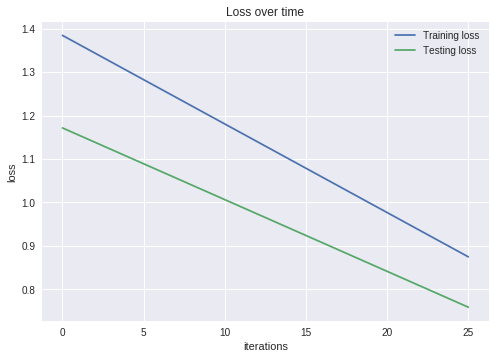

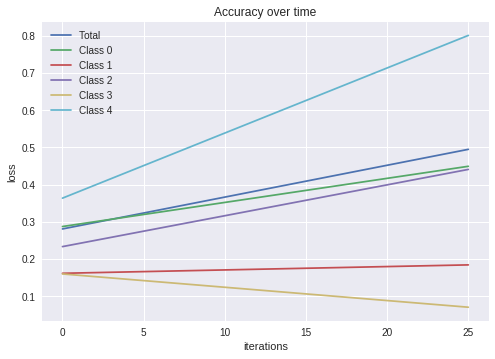

In [0]:
# Train using a DenseNet architecture
# Try even bigger batch sizes
# bottleneck doesn't work yet. Batchnorm problem

torch.cuda.empty_cache()
network = DenseNet(transform=None, start_channels=16, output_classes=5, n_per_block=6, nblocks=8, growthRate=4, bottleneck=False,
              reduce_constant=.2, kernel_size_avg_pool=2, padding_avg_pool=0, pooling=False, linear_in=187)

losses_train, losses_test, accuracy, per_class_accuracy = [], [], [], []
train_heartbeat(network, losses_train=losses_train, losses_test=losses_test, accuracy=accuracy, per_class_accuracy=per_class_accuracy,
                epochs=1, weight=torch.tensor([.4,1,1,1,1]), plot_every=1, graph_skip=25, downsample=.2)

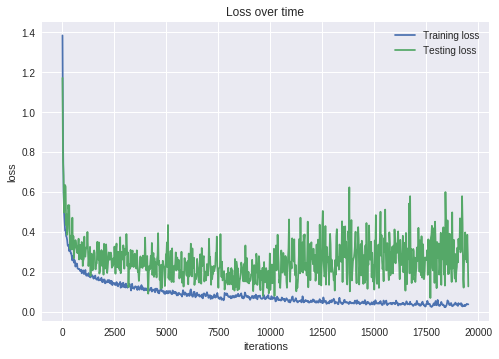

class 0 maximum accuracy: 0.9811593683866354
class 0 mean ending accuracy: 0.9753106522926916
class 1 maximum accuracy: 0.9745626640319824
class 1 mean ending accuracy: 0.9588546389922116
class 2 maximum accuracy: 0.994768226146698
class 2 mean ending accuracy: 0.9886859564230992
class 3 maximum accuracy: 0.9761280371592596
class 3 mean ending accuracy: 0.9374822813608706
class 4 maximum accuracy: 0.9990904378890991
class 4 mean ending accuracy: 0.9963633221540695
maximum accuracy averaged over weights: 0.9809095692634582 



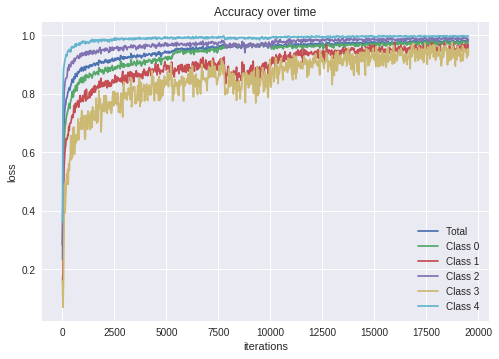

epoch: 1, averaged loss: 0.0448, accuracy: 0.9727, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.82it/s]
epoch: 2, averaged loss: 0.0279, accuracy: 0.9828, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.86it/s]
epoch: 3, averaged loss: 0.0299, accuracy: 0.9818, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.84it/s]
epoch: 4, averaged loss: 0.0390, accuracy: 0.9770, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.86it/s]
epoch: 5, averaged loss: 0.0274, accuracy: 0.9826, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.86it/s]
epoch: 6, averaged loss: 0.0254, accuracy: 0.9853, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.89it/s]
epoch: 7, averaged loss: 0.0318, accuracy: 0.9810, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.83it/s]
epoch: 8, averaged loss: 0.0315, accuracy: 0.9812, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.85it/s]
epoch: 9, averaged loss: 0.0305, accuracy: 0.9812, gpu usage: 0.

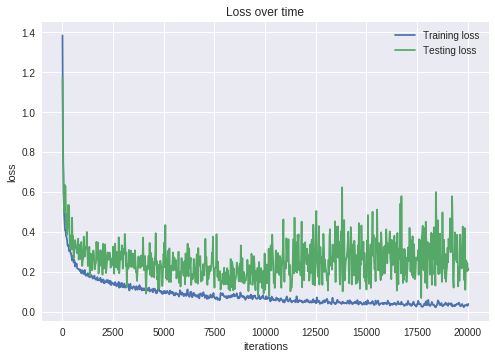

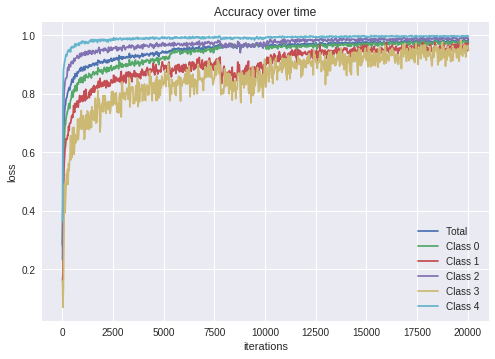

/usr/local/lib/python3.6/dist-packages/torch/serialization.py:250: UserWarning: Couldn't retrieve source code for container of type DenseNet. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:250: UserWarning: Couldn't retrieve source code for container of type DenseLayer. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:250: UserWarning: Couldn't retrieve source code for container of type TransitionLayer. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
epoch: 1, averaged loss: 0.0514, accuracy: 0.9731, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.84it/s]
epoch: 2, averaged loss: 0.0358, accuracy: 0.9782, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.87it/s]
epoch: 3, averaged loss: 

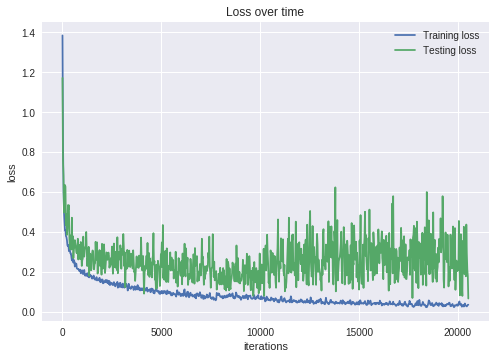

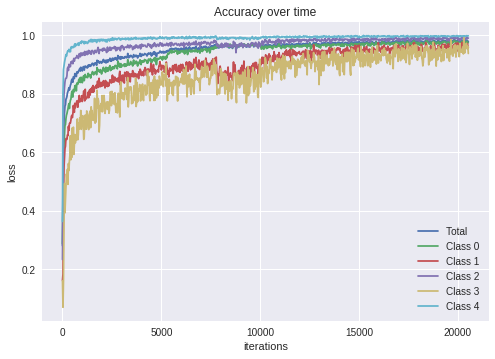

epoch: 1, averaged loss: 0.0341, accuracy: 0.9803, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.86it/s]
epoch: 2, averaged loss: 0.0319, accuracy: 0.9804, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.87it/s]
epoch: 3, averaged loss: 0.0324, accuracy: 0.9794, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.86it/s]
epoch: 4, averaged loss: 0.0295, accuracy: 0.9814, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.85it/s]
epoch: 5, averaged loss: 0.0259, accuracy: 0.9840, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.86it/s]
epoch: 6, averaged loss: 0.0209, accuracy: 0.9846, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.84it/s]
epoch: 7, averaged loss: 0.0364, accuracy: 0.9785, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.83it/s]
epoch: 8, averaged loss: 0.0413, accuracy: 0.9785, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.84it/s]
epoch: 9, averaged loss: 0.0236, accuracy: 0.9843, gpu usage: 0.

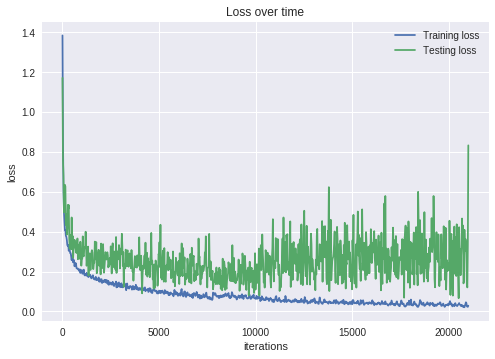

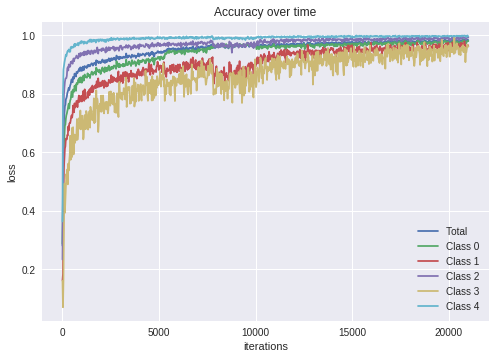

epoch: 1, averaged loss: 0.0399, accuracy: 0.9801, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.88it/s]
epoch: 2, averaged loss: 0.0335, accuracy: 0.9800, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.82it/s]
epoch: 3, averaged loss: 0.0347, accuracy: 0.9802, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.86it/s]
epoch: 4, averaged loss: 0.0304, accuracy: 0.9804, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.83it/s]
epoch: 5, averaged loss: 0.0314, accuracy: 0.9794, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.86it/s]
epoch: 6, averaged loss: 0.0287, accuracy: 0.9822, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.88it/s]
epoch: 7, averaged loss: 0.0397, accuracy: 0.9764, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.86it/s]
epoch: 8, averaged loss: 0.0341, accuracy: 0.9808, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.87it/s]
epoch: 9, averaged loss: 0.0507, accuracy: 0.9741, gpu usage: 0.

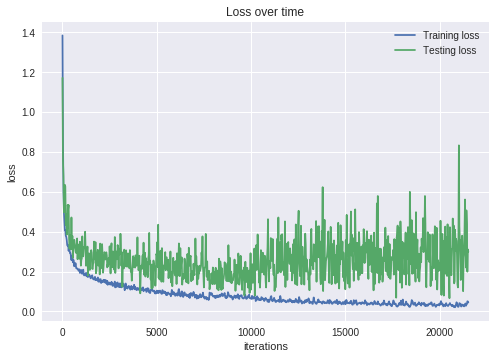

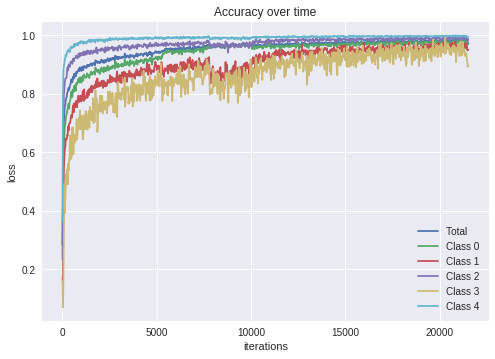

epoch: 1, averaged loss: 0.0383, accuracy: 0.9783, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.88it/s]
epoch: 2, averaged loss: 0.0287, accuracy: 0.9795, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.77it/s]
epoch: 3, averaged loss: 0.0328, accuracy: 0.9797, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.82it/s]
epoch: 4, averaged loss: 0.0351, accuracy: 0.9794, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.87it/s]
epoch: 5, averaged loss: 0.0335, accuracy: 0.9789, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.83it/s]
epoch: 6, averaged loss: 0.0328, accuracy: 0.9804, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.82it/s]
epoch: 7, averaged loss: 0.0221, accuracy: 0.9853, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.86it/s]
epoch: 8, averaged loss: 0.0200, accuracy: 0.9863, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.83it/s]
epoch: 9, averaged loss: 0.0350, accuracy: 0.9798, gpu usage: 0.

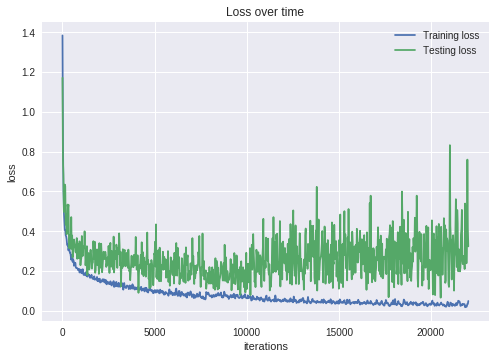

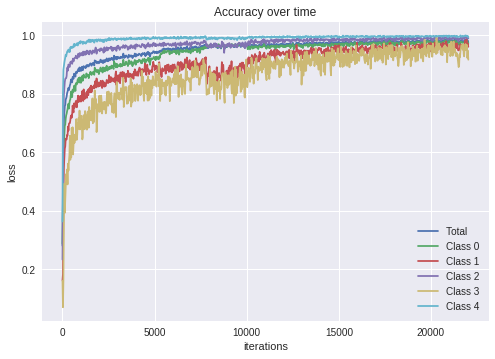

epoch: 1, averaged loss: 0.0421, accuracy: 0.9740, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.82it/s]
epoch: 2, averaged loss: 0.0316, accuracy: 0.9798, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.84it/s]
epoch: 3, averaged loss: 0.0296, accuracy: 0.9822, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.86it/s]
epoch: 4, averaged loss: 0.0272, accuracy: 0.9834, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.82it/s]
epoch: 5, averaged loss: 0.0255, accuracy: 0.9840, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.90it/s]
epoch: 6, averaged loss: 0.0265, accuracy: 0.9827, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.79it/s]
epoch: 7, averaged loss: 0.0349, accuracy: 0.9802, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.79it/s]
epoch: 8, averaged loss: 0.0304, accuracy: 0.9822, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.84it/s]
epoch: 9, averaged loss: 0.0355, accuracy: 0.9786, gpu usage: 0.

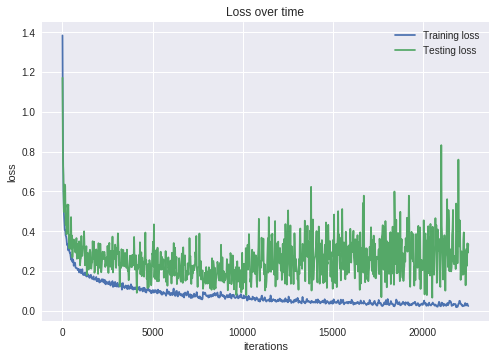

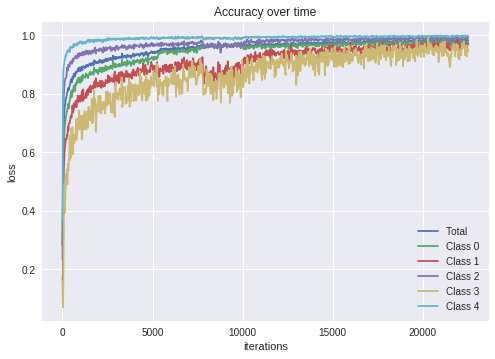

epoch: 1, averaged loss: 0.0373, accuracy: 0.9769, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.86it/s]
epoch: 2, averaged loss: 0.0277, accuracy: 0.9836, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.84it/s]
epoch: 3, averaged loss: 0.0285, accuracy: 0.9830, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.84it/s]
epoch: 4, averaged loss: 0.0291, accuracy: 0.9830, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.85it/s]
epoch: 5, averaged loss: 0.0256, accuracy: 0.9853, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.85it/s]
epoch: 6, averaged loss: 0.0271, accuracy: 0.9838, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.79it/s]
epoch: 7, averaged loss: 0.0297, accuracy: 0.9830, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.80it/s]
epoch: 8, averaged loss: 0.0371, accuracy: 0.9792, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.87it/s]
epoch: 9, averaged loss: 0.0226, accuracy: 0.9864, gpu usage: 0.

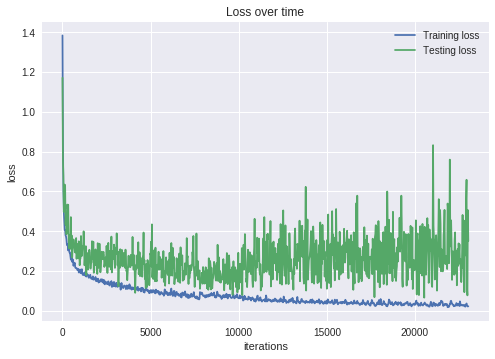

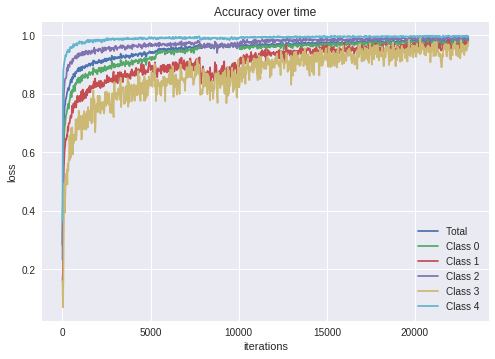

epoch: 1, averaged loss: 0.0405, accuracy: 0.9814, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.87it/s]
epoch: 2, averaged loss: 0.0309, accuracy: 0.9825, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.88it/s]
epoch: 3, averaged loss: 0.0217, accuracy: 0.9857, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.90it/s]
epoch: 4, averaged loss: 0.0263, accuracy: 0.9847, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.84it/s]
epoch: 5, averaged loss: 0.0321, accuracy: 0.9797, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.87it/s]
epoch: 6, averaged loss: 0.0285, accuracy: 0.9836, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.83it/s]
epoch: 7, averaged loss: 0.0254, accuracy: 0.9842, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.83it/s]
epoch: 8, averaged loss: 0.0376, accuracy: 0.9803, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.84it/s]
epoch: 9, averaged loss: 0.0282, accuracy: 0.9851, gpu usage: 0.

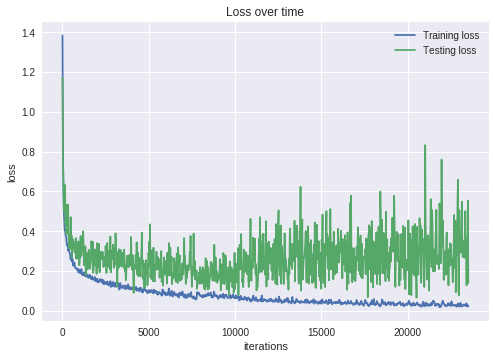

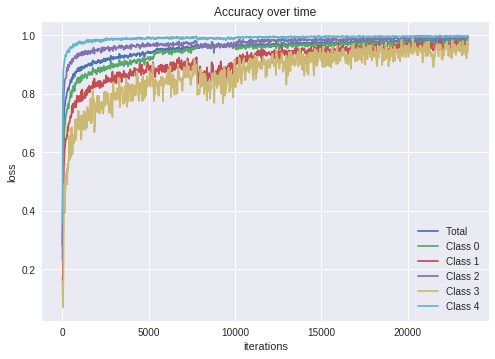

epoch: 1, averaged loss: 0.0355, accuracy: 0.9785, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.87it/s]
epoch: 2, averaged loss: 0.0278, accuracy: 0.9843, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.78it/s]
epoch: 3, averaged loss: 0.0278, accuracy: 0.9837, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.83it/s]
epoch: 4, averaged loss: 0.0196, accuracy: 0.9870, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.82it/s]
epoch: 5, averaged loss: 0.0259, accuracy: 0.9838, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.84it/s]
epoch: 6, averaged loss: 0.0338, accuracy: 0.9802, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.86it/s]
epoch: 7, averaged loss: 0.0426, accuracy: 0.9775, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.83it/s]
epoch: 8, averaged loss: 0.0338, accuracy: 0.9809, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.83it/s]
epoch: 9, averaged loss: 0.0319, accuracy: 0.9827, gpu usage: 0.

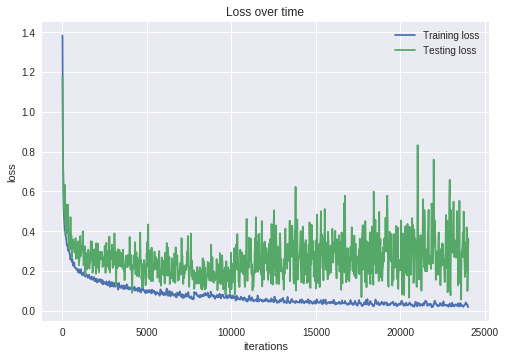

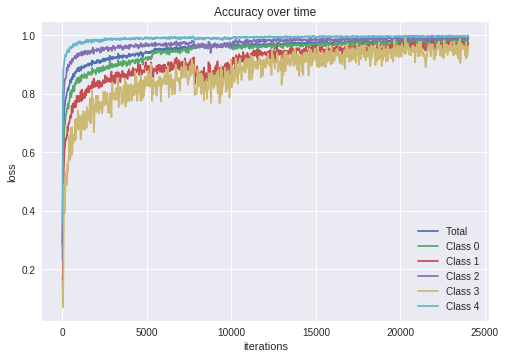

epoch: 1, averaged loss: 0.0489, accuracy: 0.9744, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.83it/s]
epoch: 2, averaged loss: 0.0273, accuracy: 0.9846, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.82it/s]
epoch: 3, averaged loss: 0.0217, accuracy: 0.9858, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.78it/s]
epoch: 4, averaged loss: 0.0258, accuracy: 0.9850, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.80it/s]
epoch: 5, averaged loss: 0.0331, accuracy: 0.9774, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.83it/s]
epoch: 6, averaged loss: 0.0308, accuracy: 0.9799, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.83it/s]
epoch: 7, averaged loss: 0.0246, accuracy: 0.9842, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.85it/s]
epoch: 8, averaged loss: 0.0332, accuracy: 0.9802, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.86it/s]
epoch: 9, averaged loss: 0.0330, accuracy: 0.9782, gpu usage: 0.

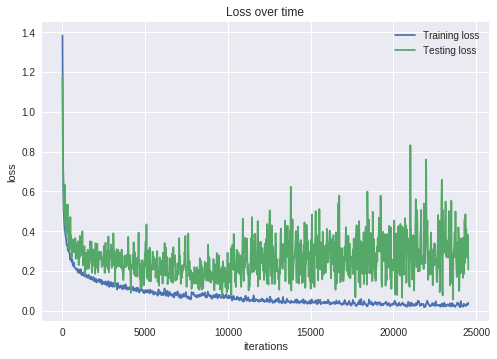

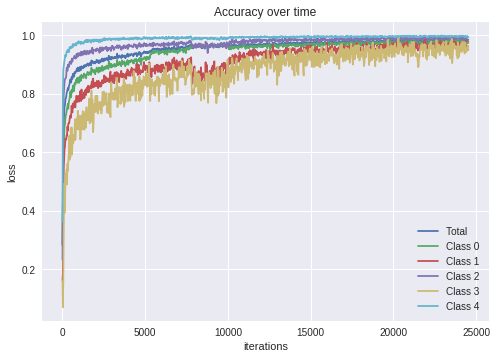

epoch: 1, averaged loss: 0.0343, accuracy: 0.9798, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.85it/s]
epoch: 2, averaged loss: 0.0312, accuracy: 0.9805, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.85it/s]
epoch: 3, averaged loss: 0.0376, accuracy: 0.9795, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.86it/s]
epoch: 4, averaged loss: 0.0251, accuracy: 0.9826, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.80it/s]
epoch: 5, averaged loss: 0.0234, accuracy: 0.9854, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.85it/s]
epoch: 6, averaged loss: 0.0299, accuracy: 0.9819, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.80it/s]
epoch: 7, averaged loss: 0.0236, accuracy: 0.9852, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.85it/s]
epoch: 8, averaged loss: 0.0215, accuracy: 0.9865, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.85it/s]
epoch: 9, averaged loss: 0.0431, accuracy: 0.9777, gpu usage: 0.

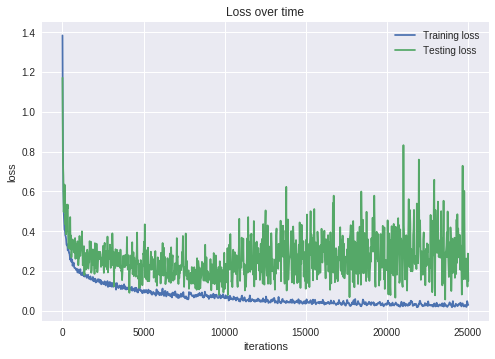

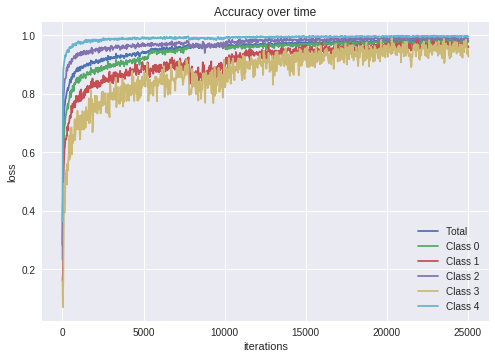

epoch: 1, averaged loss: 0.0384, accuracy: 0.9802, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.83it/s]
epoch: 2, averaged loss: 0.0247, accuracy: 0.9843, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.85it/s]
epoch: 3, averaged loss: 0.0205, accuracy: 0.9859, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.87it/s]
epoch: 4, averaged loss: 0.0243, accuracy: 0.9850, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.89it/s]
epoch: 5, averaged loss: 0.0294, accuracy: 0.9812, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.79it/s]
epoch: 6, averaged loss: 0.0366, accuracy: 0.9796, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.85it/s]
epoch: 7, averaged loss: 0.0265, accuracy: 0.9845, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.84it/s]
epoch: 8, averaged loss: 0.0224, accuracy: 0.9848, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.79it/s]
epoch: 9, averaged loss: 0.0195, accuracy: 0.9870, gpu usage: 0.

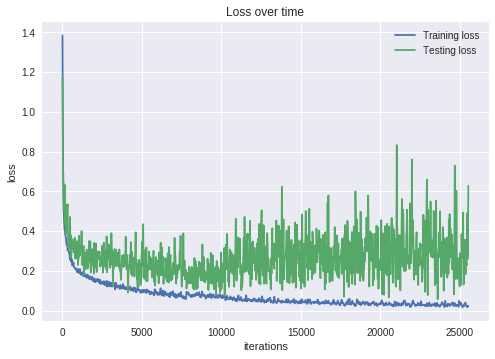

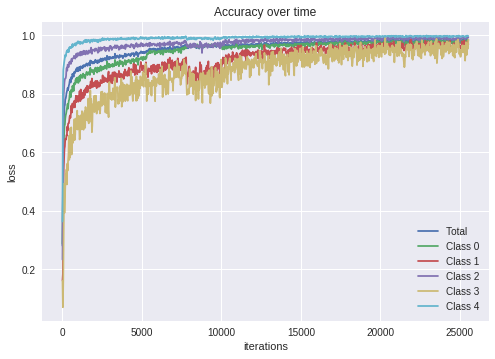

epoch: 1, averaged loss: 0.0315, accuracy: 0.9818, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.83it/s]
epoch: 2, averaged loss: 0.0287, accuracy: 0.9815, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.84it/s]
epoch: 3, averaged loss: 0.0262, accuracy: 0.9830, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.83it/s]
epoch: 4, averaged loss: 0.0311, accuracy: 0.9826, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.85it/s]
epoch: 5, averaged loss: 0.0257, accuracy: 0.9851, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.78it/s]
epoch: 6, averaged loss: 0.0179, accuracy: 0.9887, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.89it/s]
epoch: 7, averaged loss: 0.0269, accuracy: 0.9845, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.82it/s]
epoch: 8, averaged loss: 0.0294, accuracy: 0.9835, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.81it/s]
epoch: 9, averaged loss: 0.0257, accuracy: 0.9837, gpu usage: 0.

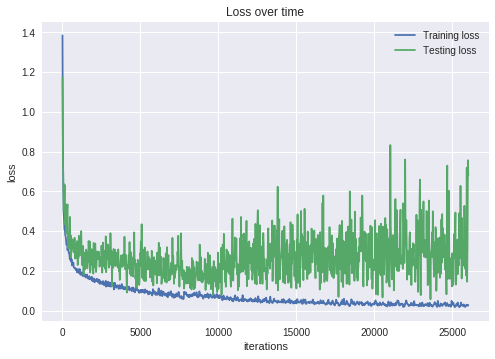

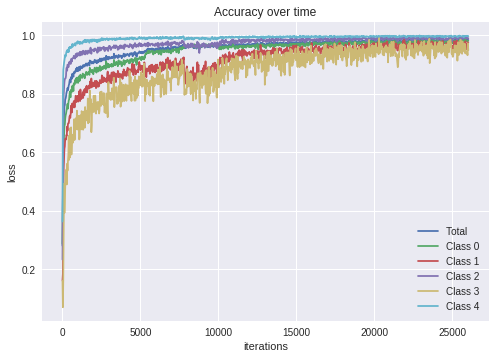

epoch: 1, averaged loss: 0.0369, accuracy: 0.9776, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.87it/s]
epoch: 2, averaged loss: 0.0243, accuracy: 0.9862, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.85it/s]
epoch: 3, averaged loss: 0.0216, accuracy: 0.9874, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.78it/s]
epoch: 4, averaged loss: 0.0287, accuracy: 0.9832, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.81it/s]
epoch: 5, averaged loss: 0.0288, accuracy: 0.9822, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.83it/s]
epoch: 6, averaged loss: 0.0251, accuracy: 0.9868, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.84it/s]
epoch: 7, averaged loss: 0.0235, accuracy: 0.9839, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.83it/s]
epoch: 8, averaged loss: 0.0263, accuracy: 0.9839, gpu usage: 0.00%: 100%|██████████| 74/74 [00:16<00:00,  4.86it/s]
epoch: 9, averaged loss: 0.0280, accuracy: 0.9833, gpu usage: 0.

KeyboardInterrupt: ignored

In [0]:

network, losses_train, losses_test, accuracy, per_class_accuracy = plot_model_results('denseNet_balanced_classes_no_transform.pt', return_bool=True)

var_dict = dict()

for i in range(50):
  train_heartbeat(network, losses_train=losses_train, losses_test=losses_test, accuracy=accuracy, per_class_accuracy=per_class_accuracy,
                epochs=10, weight=torch.tensor([.35,1.3,1,1.3,1]), plot_every=10, graph_skip=25, downsample=.3)
  
  var_dict['model'] = network
  var_dict['losses_train'] = losses_train
  var_dict['losses_test'] = losses_test
  var_dict['accuracy'] = accuracy
  var_dict['per_class_accuracy'] = per_class_accuracy

  torch.save(var_dict, root+'/denseNet_balanced_classes_no_transform.pt')

## Model Comparison

In [0]:
def plot_model_results(model_name, return_bool = False, graph_skip=25, num_classes=5):
  root = '/content/drive/My Drive/CS501/Heartbeat/'
  var_dict1 = torch.load(root + model_name)
  network = var_dict1['model']
  losses_train = var_dict1['losses_train']
  losses_test = var_dict1['losses_test']
  accuracy = var_dict1['accuracy']
  per_class_accuracy = var_dict1['per_class_accuracy']
  
  x_spacing = np.arange(len(losses_train))
  plt.plot(graph_skip*x_spacing, losses_train, label='Training loss')
  plt.plot(graph_skip*x_spacing, losses_test, label='Testing loss')
  plt.xlabel('iterations')
  plt.ylabel('loss')
  plt.title("Loss over time")
  plt.legend()
  plt.show()

  # plot accuracies
  plt.plot(graph_skip*x_spacing, accuracy, label='Total')
  for i in range(num_classes):
    print('class',i,'maximum accuracy:',np.max(np.array(per_class_accuracy)[:,i]))
    print('class',i,'mean ending accuracy:',np.mean(np.array(per_class_accuracy)[-15:,i]))
    
    plt.plot(graph_skip*x_spacing, np.array(per_class_accuracy)[:,i], label='Class '+str(i))

  print('maximum accuracy averaged over weights:', np.max(np.mean(np.array(per_class_accuracy), axis=1)),'\n')
    
  plt.xlabel('iterations')
  plt.ylabel('loss')
  plt.title("Accuracy over time")
  plt.legend()
  plt.show()
  
  if return_bool:
    return network, losses_train, losses_test, accuracy, per_class_accuracy

#### Attempts with Transform

Small Convolutional Net balanced classes


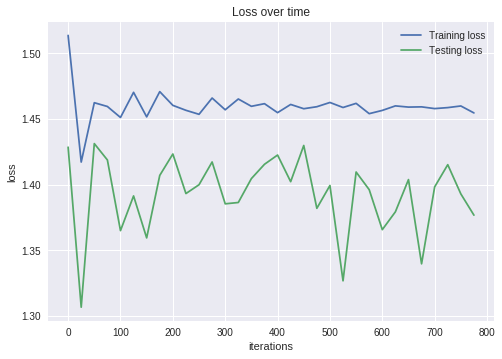

class 0 maximum accuracy: 0.2887431186437607
class 1 maximum accuracy: 0.16601144671440124
class 2 maximum accuracy: 0.2814180902563609
class 3 maximum accuracy: 0.10149129938620788
class 4 maximum accuracy: 0.30776578962802886
Maximum Accuracy averaged over weights: 0.21020748641055365 



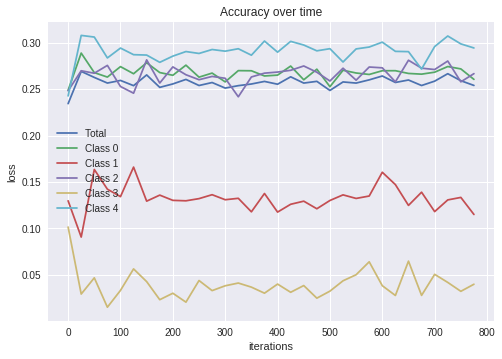








ResNet balanced classes


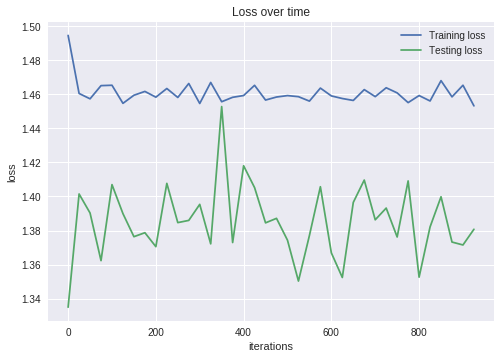

class 0 maximum accuracy: 0.28237130435613483
class 1 maximum accuracy: 0.1558826919645071
class 2 maximum accuracy: 0.2886650389432907
class 3 maximum accuracy: 0.07354545593261719
class 4 maximum accuracy: 0.31845794975757596
Maximum Accuracy averaged over weights: 0.21007436983860456 



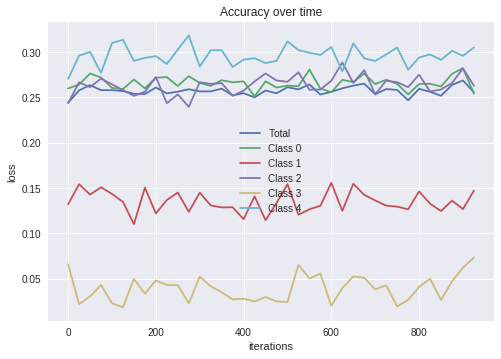

Dense Net initial attempt


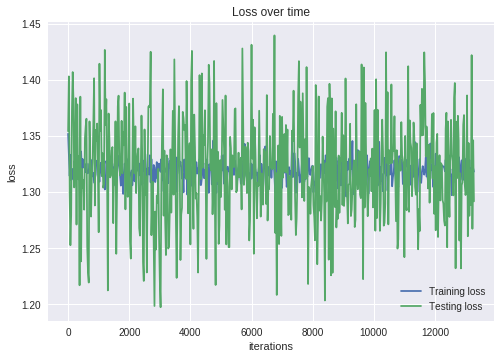

class 0 maximum accuracy: 0.5020334583062392
class 1 maximum accuracy: 0.1722763692960143
class 2 maximum accuracy: 0.2440267914533615
class 3 maximum accuracy: 0.10902777872979641
class 4 maximum accuracy: 0.2570239919424057
Maximum Accuracy averaged over weights: 0.22305987285822632 



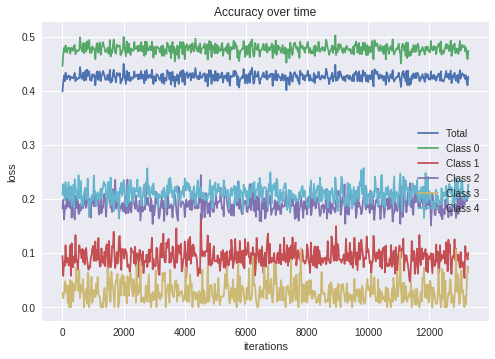








DenseNet balanced classes


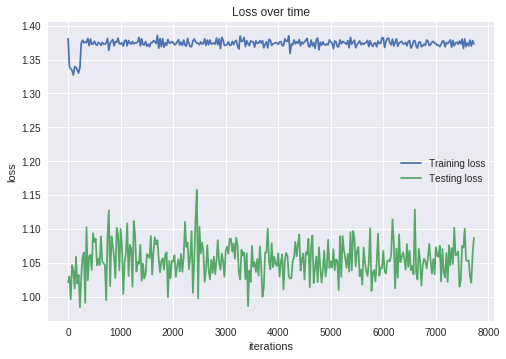

class 0 maximum accuracy: 0.44464301145993745
class 1 maximum accuracy: 0.1376991194486618
class 2 maximum accuracy: 0.23652575314044952
class 3 maximum accuracy: 0.06671129047870636
class 4 maximum accuracy: 0.2575432967681151
Maximum Accuracy averaged over weights: 0.21142340912841834 



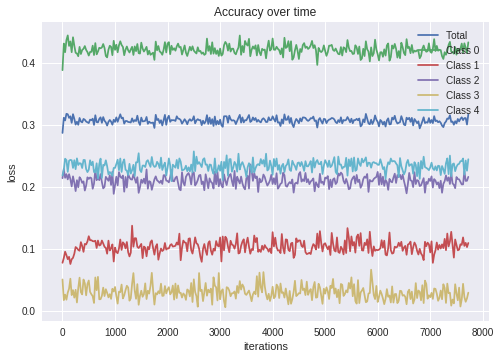








DenseNet gradual scaling up of main class weight


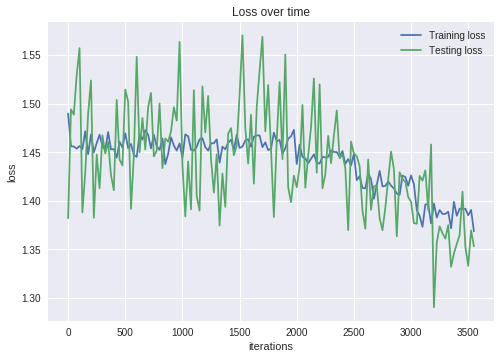

class 0 maximum accuracy: 0.4186949014663696
class 1 maximum accuracy: 0.20252754271030426
class 2 maximum accuracy: 0.3426044487953186
class 3 maximum accuracy: 0.125
class 4 maximum accuracy: 0.37125725746154786
Maximum Accuracy averaged over weights: 0.2185088928937912 



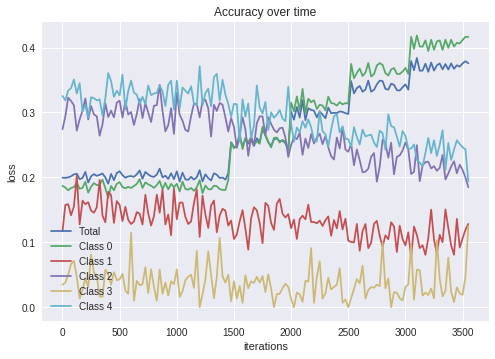

In [0]:
print('Small Convolutional Net balanced classes')
plot_model_results('simple_conv_balanced_classes.pt')

print('\n\n\n\n\n\n\nResNet balanced classes')
plot_model_results('ResNet_balanced_classes.pt')

print('Dense Net initial attempt')
plot_model_results('denseNet1.pt')

print('\n\n\n\n\n\n\nDenseNet balanced classes')
plot_model_results('denseNet_balanced_classes.pt')


print('\n\n\n\n\n\n\nDenseNet gradual scaling up of main class weight')
plot_model_results('denseNet_low_first_weight.pt')


#### Without Transform

Small Convolutional Net balanced classes + weights


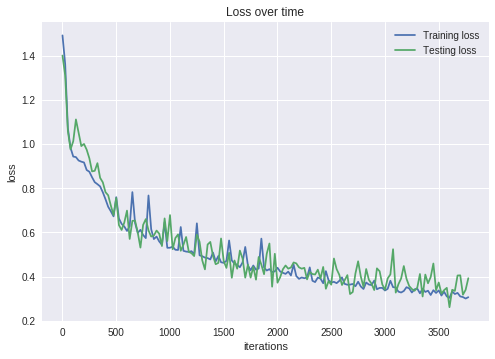

class 0 maximum accuracy: 0.7986246800422668
class 0 mean ending accuracy: 0.7798199390875986
class 1 maximum accuracy: 0.680893828868866
class 1 mean ending accuracy: 0.6590507944700044
class 2 maximum accuracy: 0.8898075406367962
class 2 mean ending accuracy: 0.8758669713460482
class 3 maximum accuracy: 0.6606876242619294
class 3 mean ending accuracy: 0.6148042146364848
class 4 maximum accuracy: 0.9639758444749392
class 4 mean ending accuracy: 0.9561031110959174
maximum accuracy averaged over weights: 0.7906337018013 



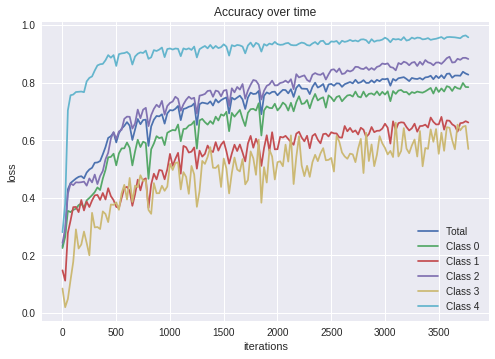








ResNet balanced classes + weights


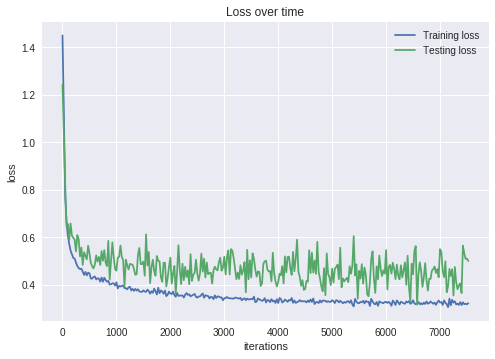

class 0 maximum accuracy: 0.7668529152870178
class 0 mean ending accuracy: 0.7477940869575891
class 1 maximum accuracy: 0.7360026102799636
class 1 mean ending accuracy: 0.704091077138216
class 2 maximum accuracy: 0.8840606075066787
class 2 mean ending accuracy: 0.8665385915438335
class 3 maximum accuracy: 0.6645078855752945
class 3 mean ending accuracy: 0.6110042379666597
class 4 maximum accuracy: 0.9565411003736349
class 4 mean ending accuracy: 0.9498802188298642
maximum accuracy averaged over weights: 0.7888561223561947 



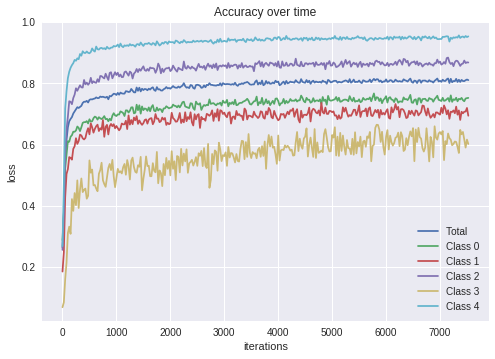








DenseNet balanced classes + weights


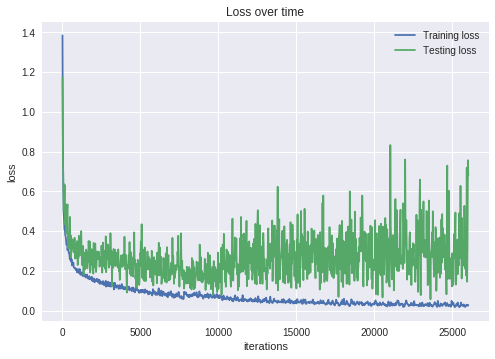

class 0 maximum accuracy: 0.9864667906210973
class 0 mean ending accuracy: 0.9815601417345879
class 1 maximum accuracy: 0.9862367177009582
class 1 mean ending accuracy: 0.9697107976950132
class 2 maximum accuracy: 0.9965115877298208
class 2 mean ending accuracy: 0.9917738177165006
class 3 maximum accuracy: 0.9922299935267522
class 3 mean ending accuracy: 0.9512048217700078
class 4 maximum accuracy: 1.0
class 4 mean ending accuracy: 0.9974547599890293
maximum accuracy averaged over weights: 0.9866955232620238 



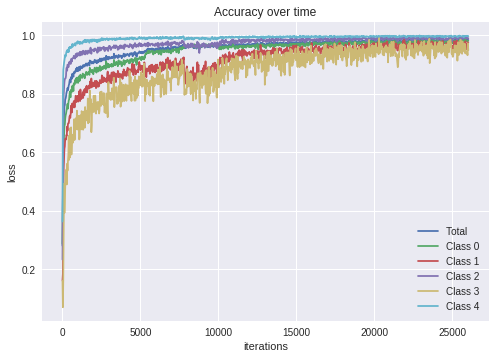

In [0]:
print('Small Convolutional Net balanced classes + weights')
plot_model_results('simple_conv_balanced_classes_no_transform.pt')

print('\n\n\n\n\n\n\nResNet balanced classes + weights')
plot_model_results('ResNet_balanced_classes_no_transform.pt')

print('\n\n\n\n\n\n\nDenseNet balanced classes + weights')
plot_model_results('denseNet_balanced_classes_no_transform.pt')